In [3]:
# Check the versions of libraries
 
# Python version
import sys
print('Python: {}'.format(sys.version))
# scipy
import scipy
print('scipy: {}'.format(scipy.__version__))
# numpy
import numpy
print('numpy: {}'.format(numpy.__version__))
# matplotlib
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
# pandas
import pandas
print('pandas: {}'.format(pandas.__version__))
# scikit-learn
import sklearn
print('sklearn: {}'.format(sklearn.__version__))

Python: 3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
scipy: 1.5.2
numpy: 1.18.5
matplotlib: 3.3.1
pandas: 1.1.1
sklearn: 0.23.2


In [4]:
# Load libraries
from numpy import log
from pandas import read_csv
from pandas.plotting import scatter_matrix
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
# Load dataset
url = "f-air-quality-data.csv"
names = ['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)', 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)', 'Wind Speed (m/s)', 'Wind Direction', 'api_weather', 'date'
]
dataset = read_csv(url, names=names, header=0)

In [6]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
1,35.8,58.7,0.0,2.733,0.280,10.000,4.1,W,Clouds,2020-09-02 19:49:24.133000
2,36.1,58.3,0.0,2.864,0.283,10.000,4.1,W,Clouds,2020-09-02 20:09:24.170000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
4,35.3,59.8,3.0,2.652,0.265,10.559,3.6,W,Clouds,2020-09-02 20:49:24.012000


In [7]:
dataset.dtypes

Temperature (°C)    float64
Humidity (%RH)      float64
PM25 (ug/m3)        float64
CO (PPM)            float64
NO2 (PPM)           float64
O3 (PPB)            float64
Wind Speed (m/s)    float64
Wind Direction       object
api_weather          object
date                 object
dtype: object

In [8]:
# see how well the data correlate against one another (particularly the APCs vs MFs)
dataset.corr()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s)
Temperature (°C),1.000000,-0.955189,0.029951,-0.140477,-0.247009,-0.029795,0.428161
Humidity (%RH),-0.955189,1.000000,-0.028794,0.150399,0.253681,-0.052110,-0.417319
PM25 (ug/m3),0.029951,-0.028794,1.000000,-0.016354,-0.006997,-0.003425,0.018089
CO (PPM),-0.140477,0.150399,-0.016354,1.000000,-0.074008,-0.224173,-0.156067
NO2 (PPM),-0.247009,0.253681,-0.006997,-0.074008,1.000000,-0.396870,-0.306331
O3 (PPB),-0.029795,-0.052110,-0.003425,-0.224173,-0.396870,1.000000,0.253206
Wind Speed (m/s),0.428161,-0.417319,0.018089,-0.156067,-0.306331,0.253206,1.000000


## We take only the hourly measurements

In [9]:
dataset = dataset[::3]

In [10]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
6,35.0,59.4,0.0,2.486,0.253,16.663,2.6,W,Clouds,2020-09-02 21:29:26.061000
9,35.1,59.1,7.0,3.041,0.270,12.623,2.6,SW,Clouds,2020-09-02 22:29:23.989000
12,34.7,60.0,0.0,2.833,0.262,12.020,1.5,W,Clouds,2020-09-02 23:29:29.660000


In [11]:
# see categorical cell values
dataset['Wind Direction'].value_counts()

N     347
W     162
SE    151
E     140
SW     96
NW     89
NE     53
S      50
Name: Wind Direction, dtype: int64

In [12]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     13
Clear                 11
Thunderstorm           5
Thunderstorm&Rain      4
Rain&Mist              1
Name: api_weather, dtype: int64

In [13]:
# reformat api weather column to be consistent (make multi-valued item order not matter)
def reformat_weather(weather_string):
    weather_conditions = weather_string.split('&')
    if (len(weather_conditions) == 1):
        return weather_string
    else:
        idx = -1
        try:
            idx = weather_conditions.index('Rain')
        except ValueError:
            print('WARNING: multivalued item is not valid')
            return weather_string
        if (idx == 1):
            weather_conditions[0],weather_conditions[1] = weather_conditions[1],weather_conditions[0]
        return "&".join(weather_conditions)
    
    
dataset['api_weather'] = dataset['api_weather'].apply(reformat_weather)

In [14]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     17
Clear                 11
Thunderstorm           5
Rain&Mist              1
Name: api_weather, dtype: int64

In [15]:
# reformat categorical columns to numerical columns
lbl_encoder = LabelEncoder()
dataset['api_weather Code'] = lbl_encoder.fit_transform(dataset.api_weather)
dataset['Wind Direction Code'] = lbl_encoder.fit_transform(dataset['Wind Direction'])
dataset.drop(['Wind Direction', 'api_weather'], axis=1, inplace=True)

In [16]:
dataset['api_weather Code'].value_counts()

1    737
2    317
4     17
0     11
5      5
3      1
Name: api_weather Code, dtype: int64

In [17]:
dataset['Wind Direction Code'].value_counts()

1    347
7    162
5    151
0    140
6     96
3     89
2     53
4     50
Name: Wind Direction Code, dtype: int64

In [18]:
dataset.date = pd.to_datetime(dataset.date, format='%Y-%m-%d %H:%M:%S')
## reformat date to appropriate numerical value (hours)
# dataset['time'] = dataset.date.apply(lambda date: (date.hour * 3600) + (date.minute * 60) + date.second)

In [19]:
# shape
print(dataset.shape)

(1088, 10)


In [20]:
# head
print(dataset.head())

    Temperature (°C)  Humidity (%RH)  PM25 (ug/m3)  CO (PPM)  NO2 (PPM)  \
0               36.1            58.7           0.0     2.913      0.292   
3               35.7            59.3          17.0     2.877      0.267   
6               35.0            59.4           0.0     2.486      0.253   
9               35.1            59.1           7.0     3.041      0.270   
12              34.7            60.0           0.0     2.833      0.262   

    O3 (PPB)  Wind Speed (m/s)                    date  api_weather Code  \
0     10.000               4.1 2020-09-02 19:29:23.949                 1   
3     10.000               3.6 2020-09-02 20:29:24.207                 1   
6     16.663               2.6 2020-09-02 21:29:26.061                 1   
9     12.623               2.6 2020-09-02 22:29:23.989                 1   
12    12.020               1.5 2020-09-02 23:29:29.660                 1   

    Wind Direction Code  
0                     7  
3                     7  
6             

In [21]:
# check for nulls
dataset.isnull().sum()

Temperature (°C)       0
Humidity (%RH)         0
PM25 (ug/m3)           0
CO (PPM)               0
NO2 (PPM)              0
O3 (PPB)               0
Wind Speed (m/s)       0
date                   0
api_weather Code       0
Wind Direction Code    0
dtype: int64

In [22]:
# descriptions
dataset['Temperature (°C)'] = dataset['Temperature (°C)'].astype(float)
print(dataset.describe(include = 'all', datetime_is_numeric=True))

       Temperature (°C)  Humidity (%RH)  PM25 (ug/m3)     CO (PPM)  \
count       1088.000000     1088.000000   1088.000000  1088.000000   
mean          35.228885       57.902436    166.877681     5.489839   
min           30.600000       39.650000      0.000000     1.926000   
25%           33.450000       53.737500      8.000000     4.535125   
50%           34.800000       59.100000     14.000000     5.262000   
75%           36.800000       62.800000     23.500000     6.134000   
max           42.050000       76.300000  36280.000000    68.387000   
std            2.300985        6.117448   2262.627337     2.922181   

         NO2 (PPM)     O3 (PPB)  Wind Speed (m/s)  \
count  1088.000000  1088.000000       1088.000000   
mean      0.100909    51.121215          2.312151   
min       0.010000    10.000000          0.350000   
25%       0.068500    27.938000          1.000000   
50%       0.102000    44.116000          2.100000   
75%       0.125500    67.793250          3.100000  

# Plot and check for outliers
Consider only the gases as they are susceptible to noise

array([<AxesSubplot:xlabel='date', ylabel='PM25 (ug/m3)'>], dtype=object)

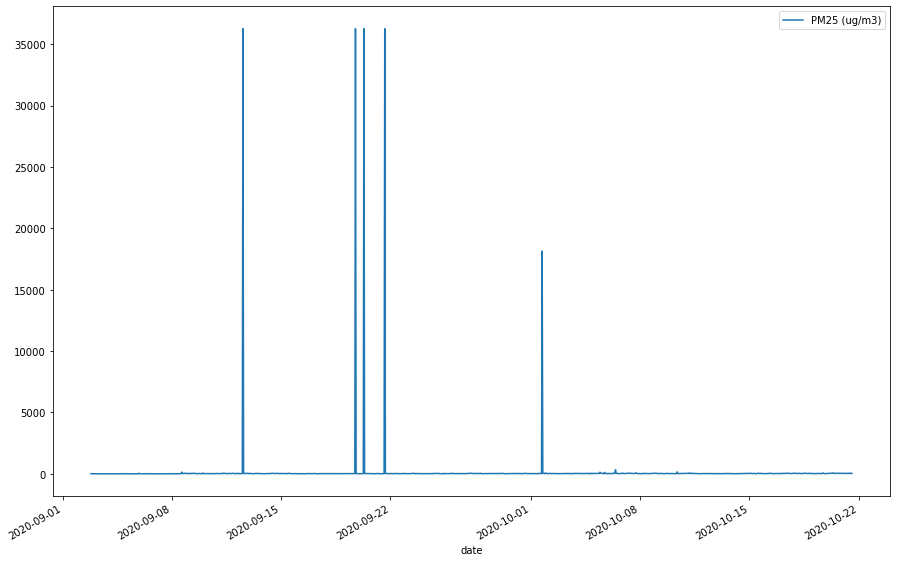

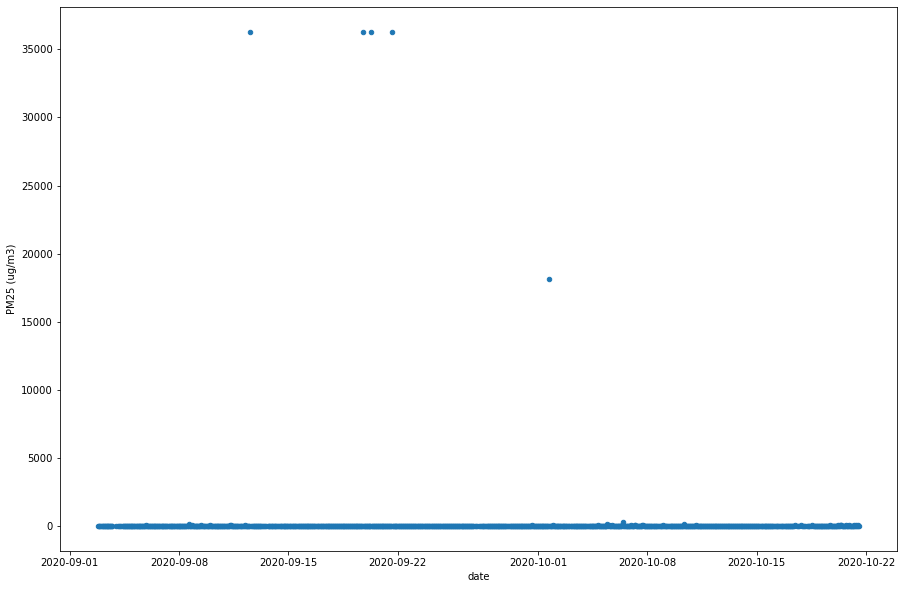

In [21]:
dataset.plot(kind = 'line', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

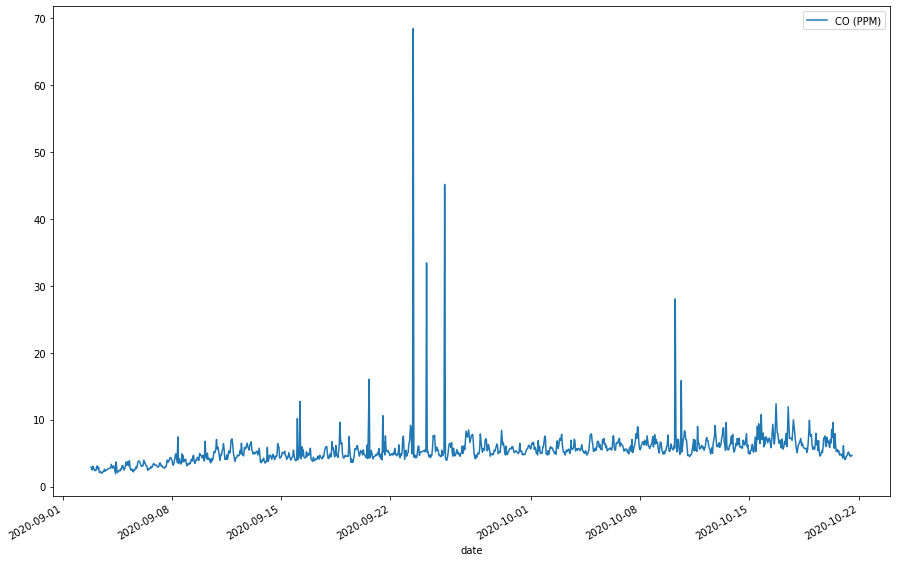

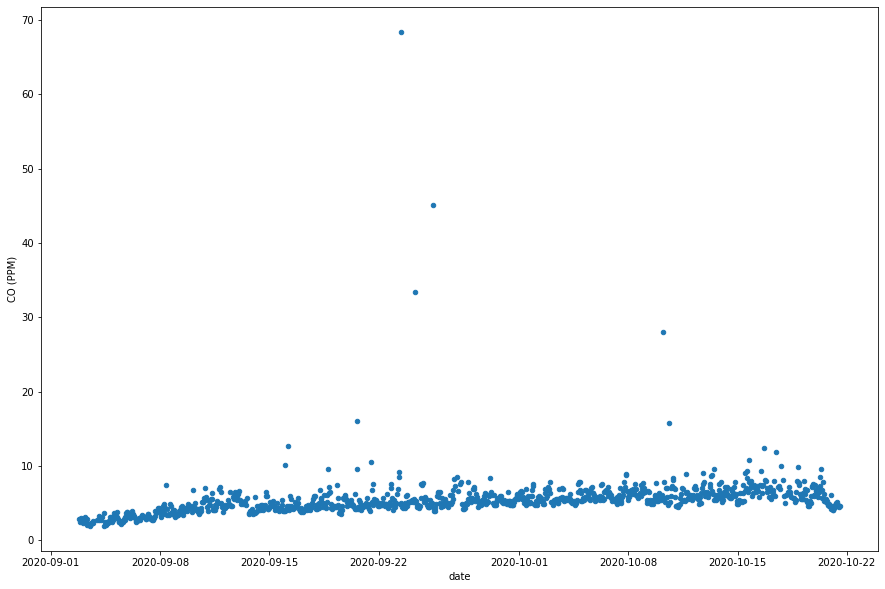

In [22]:
dataset.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

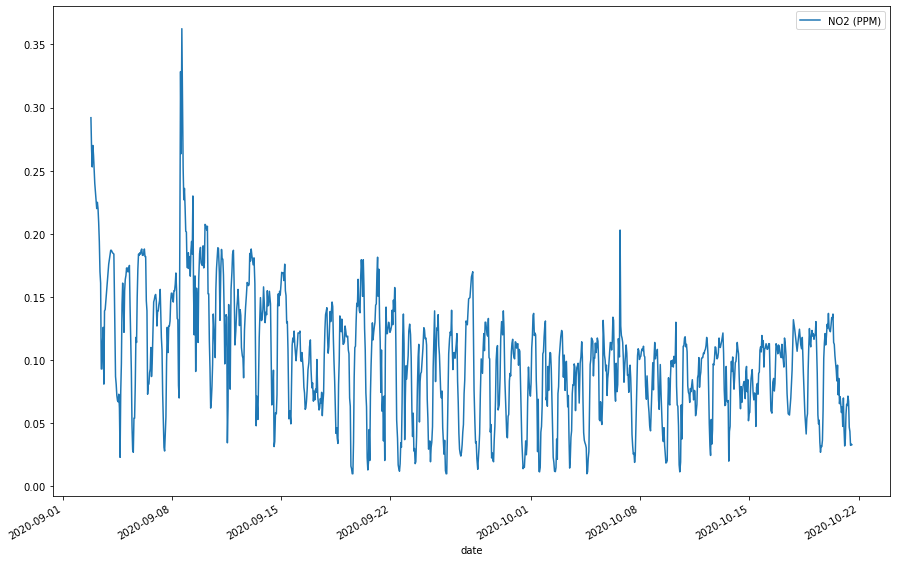

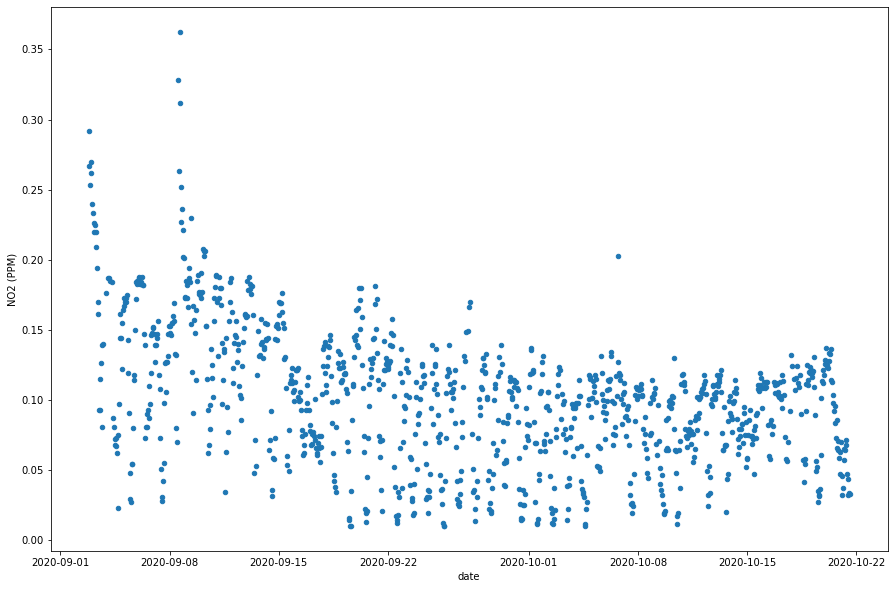

In [30]:
dataset.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

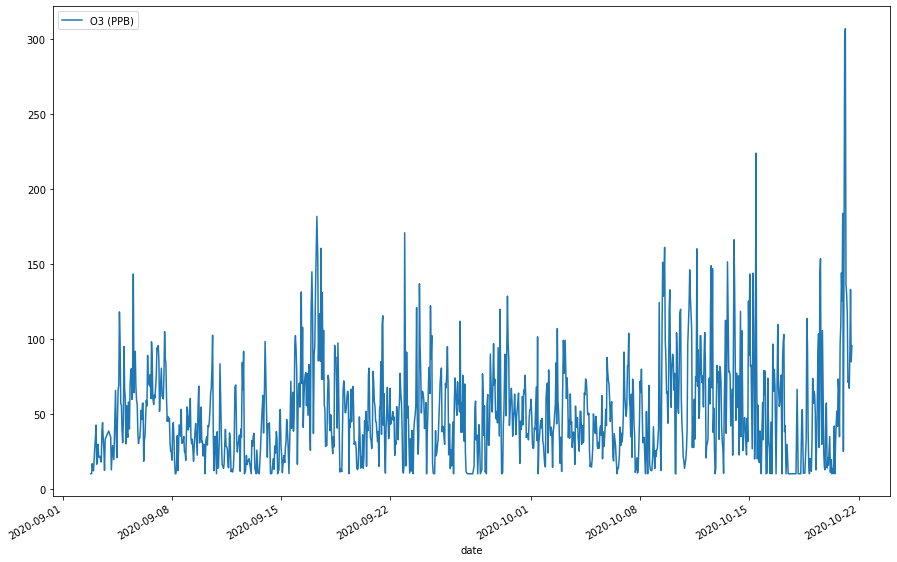

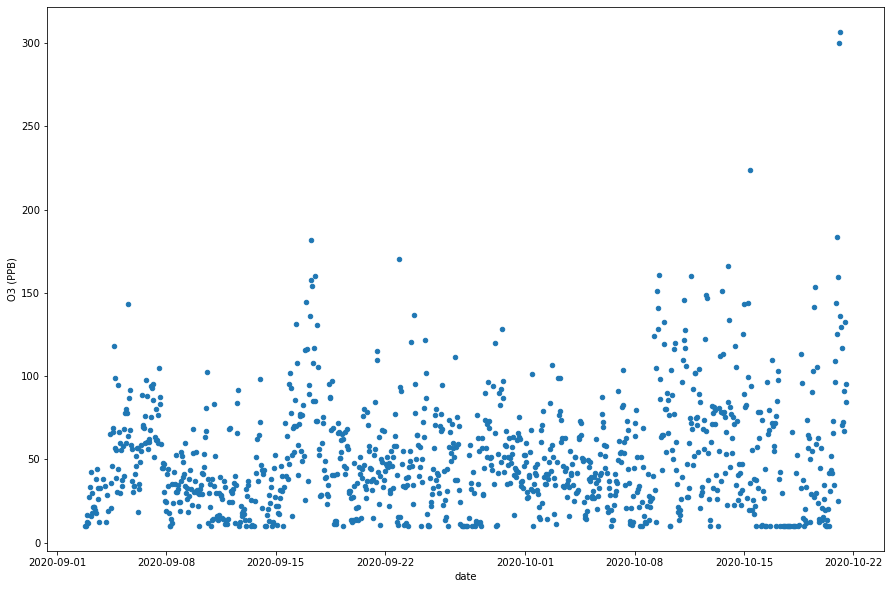

In [31]:
dataset.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

## Identifying Outliers with Skewness
[Reference](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

In [22]:
print(dataset['PM25 (ug/m3)'].skew())
dataset['PM25 (ug/m3)'].describe()

15.452260004927922


count     1088.000000
mean       166.877681
std       2262.627337
min          0.000000
25%          8.000000
50%         14.000000
75%         23.500000
max      36280.000000
Name: PM25 (ug/m3), dtype: float64

In [23]:
print(dataset['CO (PPM)'].skew())
dataset['CO (PPM)'].describe()

12.83057262445107


count    1088.000000
mean        5.489839
std         2.922181
min         1.926000
25%         4.535125
50%         5.262000
75%         6.134000
max        68.387000
Name: CO (PPM), dtype: float64

In [24]:
print(dataset['NO2 (PPM)'].skew())
dataset['NO2 (PPM)'].describe()

0.6711193418876237


count    1088.000000
mean        0.100909
std         0.048206
min         0.010000
25%         0.068500
50%         0.102000
75%         0.125500
max         0.362500
Name: NO2 (PPM), dtype: float64

In [25]:
print(dataset['O3 (PPB)'].skew())
dataset['O3 (PPB)'].describe()

1.736110342552237


count    1088.000000
mean       51.121215
std        34.016256
min        10.000000
25%        27.938000
50%        44.116000
75%        67.793250
max       306.724000
Name: O3 (PPB), dtype: float64

# We need to remove those outliers!
## Best way to do this is by interpolating the outlier data since dropping the entire row will affect the other features

We consider two ways to do this:
1. [Use the quantile values to remove the outliers and then interpolate](#quantile_interpolation)
2. [Use the z-score to determine values which need to be interpolated and then interpolate](#zscore_interpolation)

## Use the quantile values to remove the outliers and then interpolate <a id='quantile_interpolation'>[1]</a>
We use the median value to interpolate the outliers

In [23]:
pm25_max_threshold, pm25_min_threshold = dataset['PM25 (ug/m3)'].quantile([0.99, 0.01])
print('pm25 max threshold: ' + str(pm25_max_threshold))
print('pm25 min threshold: ' + str(pm25_min_threshold))

co_max_threshold, co_min_threshold = dataset['CO (PPM)'].quantile([0.99, 0.01])
print('co max threshold: ' + str(co_max_threshold))
print('co min threshold: ' + str(co_min_threshold))

no2_max_threshold, no2_min_threshold = dataset['NO2 (PPM)'].quantile([0.99, 0.01])
print('no2 max threshold: ' + str(no2_max_threshold))
print('no2 min threshold: ' + str(no2_min_threshold))

o3_max_threshold, o3_min_threshold = dataset['O3 (PPB)'].quantile([0.99, 0.01])
print('o3 max threshold: ' + str(o3_max_threshold))
print('o3 min threshold: ' + str(o3_min_threshold))

pm25 max threshold: 70.12999999999988
pm25 min threshold: 0.0
co max threshold: 10.223264999999948
co min threshold: 2.275
no2 max threshold: 0.23651999999999954
no2 min threshold: 0.012
o3 max threshold: 157.96385999999978
o3 min threshold: 10.0


In [24]:
# identify how many we need to interpolate

ol_count = dataset[ (dataset['PM25 (ug/m3)'] < pm25_min_threshold) | (dataset['PM25 (ug/m3)'] > pm25_max_threshold) ].shape[0]
print('pm25 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['CO (PPM)'] < co_min_threshold) | (dataset['CO (PPM)'] > co_max_threshold) ].shape[0]
print('co outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['NO2 (PPM)'] < no2_min_threshold) | (dataset['NO2 (PPM)'] > no2_max_threshold) ].shape[0]
print('no2 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['O3 (PPB)'] < o3_min_threshold) | (dataset['O3 (PPB)'] > o3_max_threshold) ].shape[0]
print('o3 outliers: {}'.format(ol_count))

pm25 outliers: 11
co outliers: 21
no2 outliers: 20
o3 outliers: 11


In [25]:
# get the median value for the dataset
pm25_median = dataset['PM25 (ug/m3)'].quantile(0.5)
co_median = dataset['CO (PPM)'].quantile(0.5)
no2_median = dataset['NO2 (PPM)'].quantile(0.5)
o3_median = dataset['O3 (PPB)'].quantile(0.5)

In [26]:
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].apply(lambda x: x if x <= pm25_max_threshold and x >= pm25_min_threshold
                                  else pm25_median)
dataset['CO (PPM)'] = dataset['CO (PPM)'].apply(lambda x: x if x <= co_max_threshold and x >= co_min_threshold
                                  else co_median)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].apply(lambda x: x if x <= no2_max_threshold and x >= no2_min_threshold
                                  else no2_median)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].apply(lambda x: x if x <= o3_max_threshold and x >= o3_min_threshold
                                  else o3_median)

## We use the zscore to determine values which need to be interpolated <a id='zscore_interpolation'>[2] </a>
[Stackoverflow solution for this scenario](https://stackoverflow.com/questions/59678724/replace-given-columns-outliers-with-mean-of-before-and-after-rows-values-in-pa)

In [28]:
from scipy import stats

In [24]:
mask = (np.abs(stats.zscore(dataset['PM25 (ug/m3)'])) > 1.65)
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].mask(mask).interpolate()

In [25]:
mask = (np.abs(stats.zscore(dataset['CO (PPM)'])) > 1.65)
dataset['CO (PPM)'] = dataset['CO (PPM)'].mask(mask).interpolate()

In [26]:
mask = (np.abs(stats.zscore(dataset['NO2 (PPM)'])) > 1.65)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].mask(mask).interpolate()

In [27]:
mask = (np.abs(stats.zscore(dataset['O3 (PPB)'])) > 1.65)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].mask(mask).interpolate()

In [28]:
# check for nulls
dataset.isnull().sum()

Temperature (°C)        0
Humidity (%RH)          0
PM25 (ug/m3)            0
CO (PPM)                0
NO2 (PPM)              13
O3 (PPB)                0
Wind Speed (m/s)        0
date                    0
api_weather Code        0
Wind Direction Code     0
dtype: int64

In [29]:
# fill nulls with median value
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].fillna(dataset['NO2 (PPM)'].quantile(0.5))

In [30]:
# check for nulls again
dataset.isnull().sum()

Temperature (°C)       0
Humidity (%RH)         0
PM25 (ug/m3)           0
CO (PPM)               0
NO2 (PPM)              0
O3 (PPB)               0
Wind Speed (m/s)       0
date                   0
api_weather Code       0
Wind Direction Code    0
dtype: int64

### Let's plot again

array([<AxesSubplot:xlabel='date', ylabel='PM25 (ug/m3)'>], dtype=object)

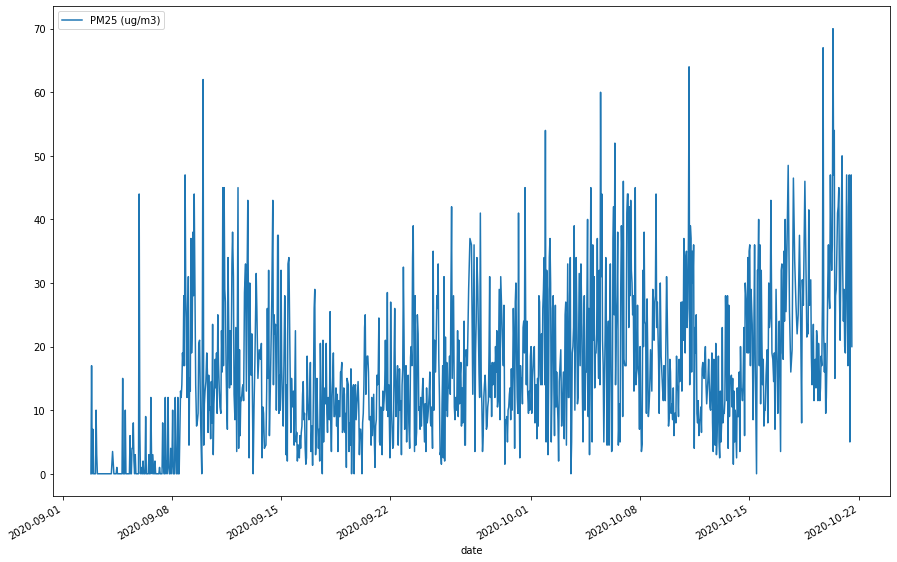

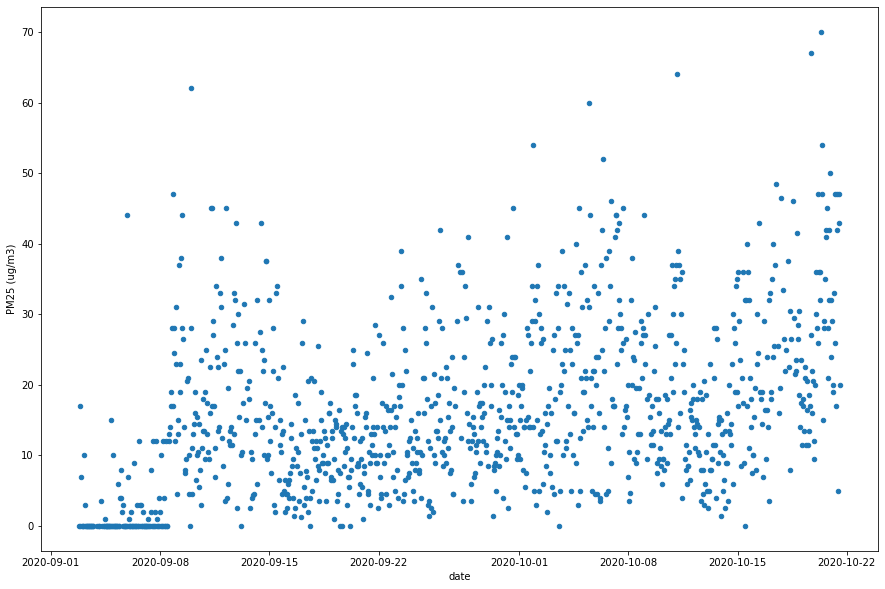

In [29]:
dataset.plot(kind = 'line', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

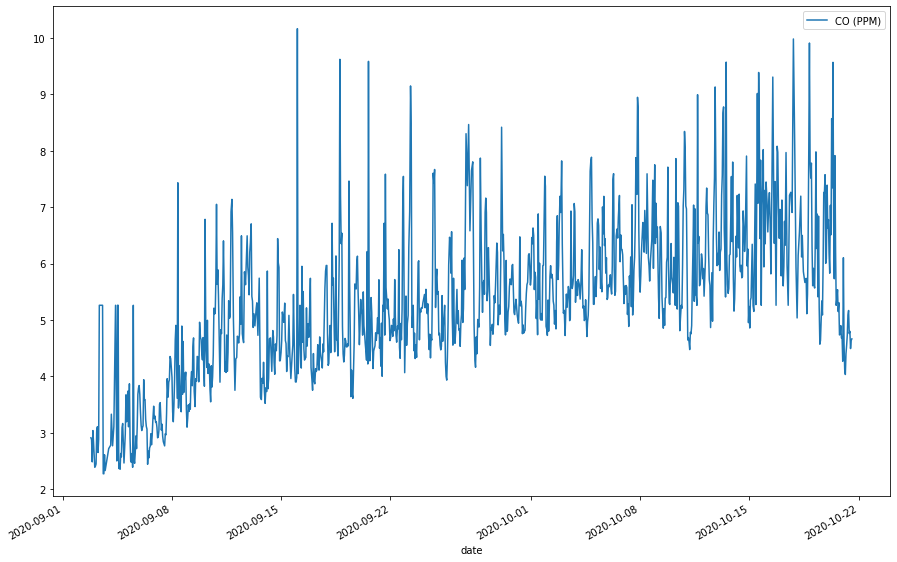

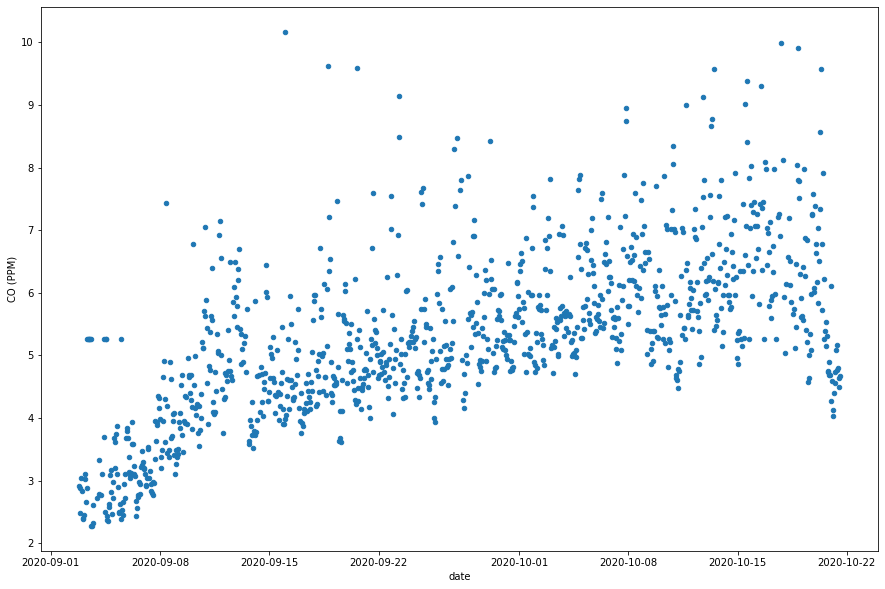

In [30]:
dataset.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

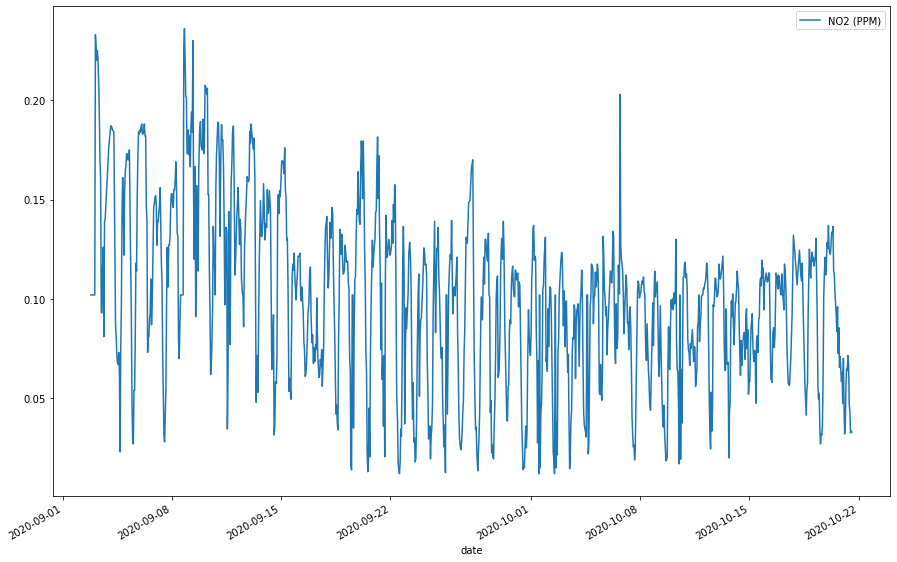

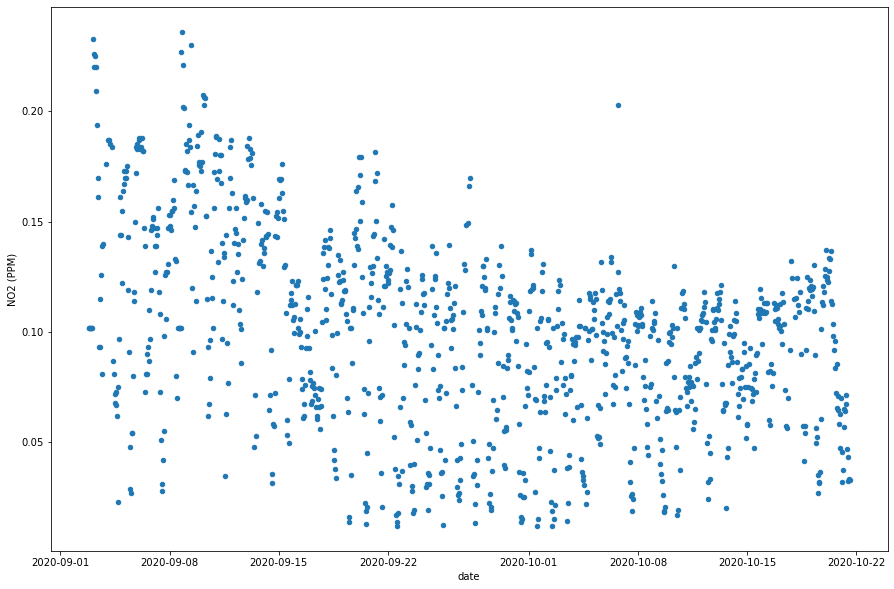

In [31]:
dataset.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

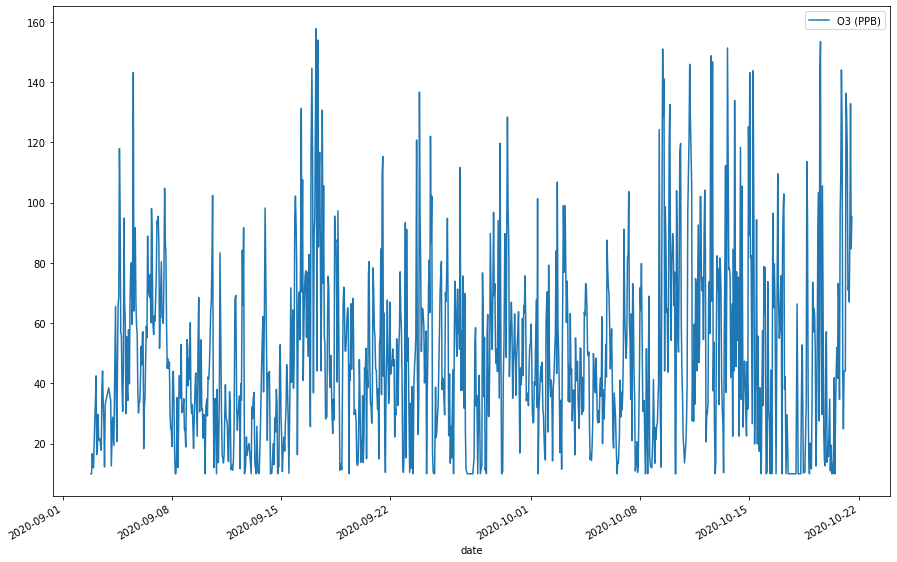

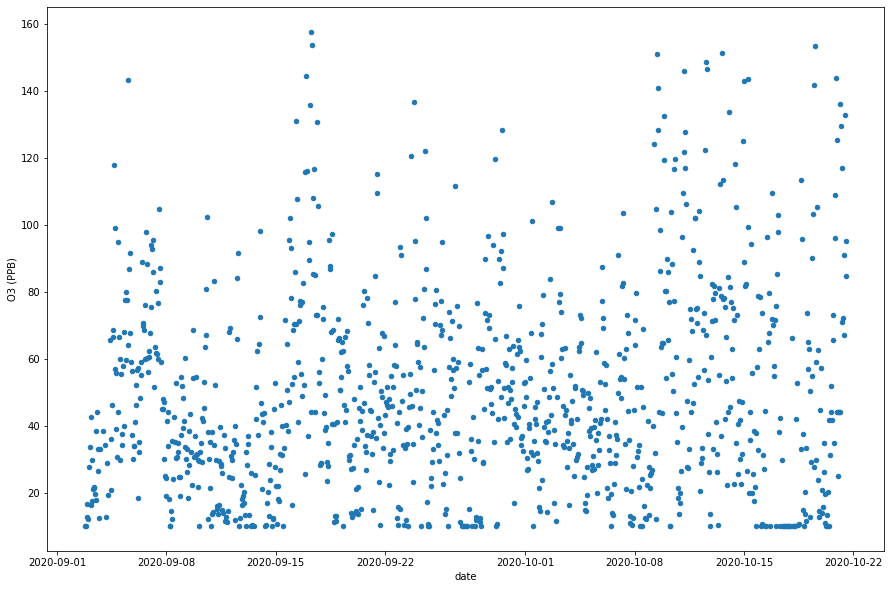

In [32]:
dataset.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
dataset.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

# Do statistical tests and do transformations if necessary
[Reference](https://machinelearningmastery.com/time-series-data-stationary-python/)

<AxesSubplot:>

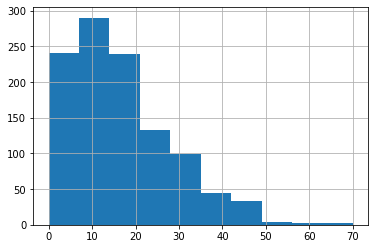

In [96]:
dataset['PM25 (ug/m3)'].hist()

<AxesSubplot:>

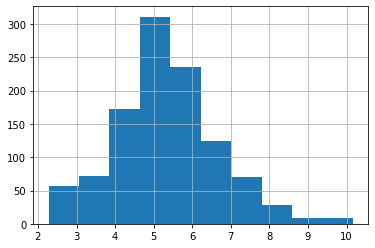

In [97]:
dataset['CO (PPM)'].hist()

<AxesSubplot:>

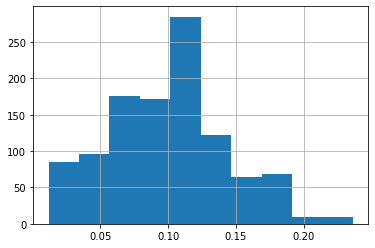

In [98]:
dataset['NO2 (PPM)'].hist()

<AxesSubplot:>

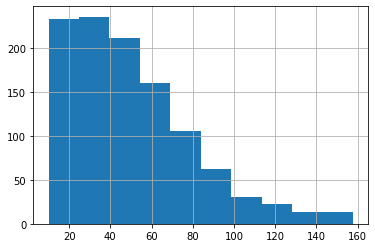

In [99]:
dataset['O3 (PPB)'].hist()

## Shapiro-Wilk Test (test for normality)
[Reference for these tests](https://machinelearningmastery.com/a-gentle-introduction-to-normality-tests-in-python/)

In [100]:
from scipy.stats import shapiro

### PM2.5

In [101]:
stat, p = shapiro(dataset['PM25 (ug/m3)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.940, p=0.000
Sample does not look Gaussian (reject H0)


### CO

In [102]:
stat, p = shapiro(dataset['CO (PPM)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.988, p=0.000
Sample does not look Gaussian (reject H0)


### NO2

In [103]:
stat, p = shapiro(dataset['NO2 (PPM)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.987, p=0.000
Sample does not look Gaussian (reject H0)


### O3

In [104]:
stat, p = shapiro(dataset['O3 (PPB)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.932, p=0.000
Sample does not look Gaussian (reject H0)


## D’Agostino’s K^2 Test (test for normality)

In [105]:
from scipy.stats import normaltest

### PM2.5

In [106]:
# normality test
stat, p = normaltest(dataset['PM25 (ug/m3)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=135.854, p=0.000
Sample does not look Gaussian (reject H0)


### CO

In [107]:
# normality test
stat, p = normaltest(dataset['CO (PPM)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=26.512, p=0.000
Sample does not look Gaussian (reject H0)


### NO2

In [108]:
# normality test
stat, p = normaltest(dataset['NO2 (PPM)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=10.528, p=0.005
Sample does not look Gaussian (reject H0)


### O3

In [109]:
# normality test
stat, p = normaltest(dataset['O3 (PPB)'].values)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=137.939, p=0.000
Sample does not look Gaussian (reject H0)


## Anderson-Darling Test (test for normality)

In [111]:
from scipy.stats import anderson

### PM2.5

In [112]:
# normality test
result = anderson(dataset['PM25 (ug/m3)'].values)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 14.406
15.000: 0.574, data does not look normal (reject H0)
10.000: 0.654, data does not look normal (reject H0)
5.000: 0.784, data does not look normal (reject H0)
2.500: 0.915, data does not look normal (reject H0)
1.000: 1.088, data does not look normal (reject H0)


### CO

In [113]:
# normality test
result = anderson(dataset['CO (PPM)'].values)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 2.979
15.000: 0.574, data does not look normal (reject H0)
10.000: 0.654, data does not look normal (reject H0)
5.000: 0.784, data does not look normal (reject H0)
2.500: 0.915, data does not look normal (reject H0)
1.000: 1.088, data does not look normal (reject H0)


### NO2

In [114]:
# normality test
result = anderson(dataset['NO2 (PPM)'].values)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 2.865
15.000: 0.574, data does not look normal (reject H0)
10.000: 0.654, data does not look normal (reject H0)
5.000: 0.784, data does not look normal (reject H0)
2.500: 0.915, data does not look normal (reject H0)
1.000: 1.088, data does not look normal (reject H0)


### O3

In [115]:
# normality test
result = anderson(dataset['O3 (PPB)'].values)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 16.003
15.000: 0.574, data does not look normal (reject H0)
10.000: 0.654, data does not look normal (reject H0)
5.000: 0.784, data does not look normal (reject H0)
2.500: 0.915, data does not look normal (reject H0)
1.000: 1.088, data does not look normal (reject H0)


## Augmented Dickey-Fuller test (test for stationarity)

In [117]:
from statsmodels.tsa.stattools import adfuller

### PM2.5

In [118]:
X = dataset['PM25 (ug/m3)'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -20.251880
p-value: 0.000000
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\numpy\linalg\linalg.py:1872: RuntimeWarning: invalid value encountered in greater
  return count_nonzero(S > tol, axis=-1)


### CO

In [119]:
X = dataset['CO (PPM)'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.445061
p-value: 0.129420
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


### NO2

In [120]:
X = dataset['NO2 (PPM)'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.672095
p-value: 0.078993
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


### O3

In [121]:
X = dataset['O3 (PPB)'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.297889
p-value: 0.000000
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


# Choose a feature engineering technique

## [1] Split the dataset into hourly observations
e.g. create a dataset containing only the 11th hour observations
We only consider the 1st to the 12th hour observations plus one for the current hour observations.

In [72]:
hours_count = 12

In [ ]:
hourly_df = list()
for nth_hour in range(1, hours_count + 1, 1):
    if nth_hour == hours_count:
        mask = dataset['date'].dt.hour % hours_count == 0
    else:
        mask = dataset['date'].dt.hour % hours_count == nth_hour
    df = dataset.loc[mask].copy()
    hourly_df.append(df)

In [ ]:
# check if the shapes are equal
for idx in range(len(hourly_df)):
    print(hourly_df[idx].shape)

In [ ]:
lowest_shape = 86
# balance the shapes of each hourly df
for idx in range(len(hourly_df)):
    while hourly_df[idx].shape[0] > lowest_shape:
        hourly_df[idx].drop(hourly_df[idx].tail(1).index,inplace=True) # drop last row

In [ ]:
for idx in range(len(hourly_df)):
    print(hourly_df[idx].shape)

## [2] Reformat the time series data to a supervised machine learning problem
That is, make the inputs (MFs and APCs) be related to its past inputs (features) in predicting its future outputs (label)

![Feature engineering of the data](figs/ml_test/feature_engineering.png)

In [27]:
from pandas import DataFrame
from pandas import concat

### Lagging series function helpers

In [123]:
def transform_series_to_lag_dataframe(series, window_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if window_size < 1:
        window_size = 1
    # concatenate the lagging series to the dataframe, 
    #   start from highest index to preserve order of the lagging series (current series should be at last column)
    for count in range(window_size, 0, -1):
        df_out[series.name + '(t-{})'.format(count)] = series.shift(count)
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    return df_out

def transform_dataframe_to_lag_dataframe(dataframe, include_columns=None, window_size=1, drop_nan=True):
    df_out = DataFrame()
    if window_size < 1:
        window_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each lagging dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lag_dataframe(dataframe[column], window_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [124]:
sv_data =  transform_dataframe_to_lag_dataframe(dataset, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], window_size=12, drop_nan=True)

### Leading series function helpers

In [28]:
def transform_series_to_lead_dataframe(series, forecast_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if forecast_size < 1:
        forecast_size = 1
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    # concatenate the leading series to the dataframe, 
    #   start from lowest index to preserve order of the leading series (current series should be at first column)
    for count in range(1, forecast_size + 1, 1):
        df_out[series.name + '(t+{})'.format(count)] = series.shift(-count)
    return df_out

def transform_dataframe_to_lead_dataframe(dataframe, include_columns=None, forecast_size=1, drop_nan=True):
    df_out = DataFrame()
    if forecast_size < 1:
        forecast_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each leading dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lead_dataframe(dataframe[column], forecast_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [29]:
sv_data =  transform_dataframe_to_lead_dataframe(dataset, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], forecast_size=12, drop_nan=True)

In [30]:
sv_data.columns

Index(['Temperature (°C)', 'Temperature (°C)(t+1)', 'Temperature (°C)(t+2)',
       'Temperature (°C)(t+3)', 'Temperature (°C)(t+4)',
       'Temperature (°C)(t+5)', 'Temperature (°C)(t+6)',
       'Temperature (°C)(t+7)', 'Temperature (°C)(t+8)',
       'Temperature (°C)(t+9)',
       ...
       'Wind Direction Code(t+3)', 'Wind Direction Code(t+4)',
       'Wind Direction Code(t+5)', 'Wind Direction Code(t+6)',
       'Wind Direction Code(t+7)', 'Wind Direction Code(t+8)',
       'Wind Direction Code(t+9)', 'Wind Direction Code(t+10)',
       'Wind Direction Code(t+11)', 'Wind Direction Code(t+12)'],
      dtype='object', length=118)

# Let's finalize the data, at this point, most of the preprocessing is complete, the rest will be done based on the machine learning model

In [31]:
# remove the date column (if time series is used)
sv_data.drop(['date'], axis=1, inplace=True)

In [ ]:
# remove the date column (if hourly observations is used)
for idx in range(len(hourly_df)):
    hourly_df[idx].drop(['date'], axis=1, inplace=True)

# Machine Learning begins...
Unfortunately, most models only support one output with multiple inputs, but we have four. So we have to make this model four times.

- y, target value/predictor
- x, dependent values

## let's get the metrics here: root mean squared error  and plcc (correlation coefficient)

In [32]:
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr

In [33]:
# for saving the model to a file
import joblib

## [1] If the hourly observations feature engineering technique is used...

We create a model for each hourly observation where the current hourly observation is the input feature and the next hourly observation is the label.

In [80]:
targ_df = hourly_df[0]
label_df = hourly_df[1]

NameError: name 'hourly_df' is not defined

In [81]:
# APCs
pm25_idx = label_df.columns.get_loc('PM25 (ug/m3)')
co_idx   = label_df.columns.get_loc('CO (PPM)')
no2_idx   = label_df.columns.get_loc('NO2 (PPM)')
o3_idx   = label_df.columns.get_loc('O3 (PPB)')
# MFs
temp_idx = label_df.columns.get_loc('Temperature (°C)')
hum_idx = label_df.columns.get_loc('Humidity (%RH)')
wind_speed_idx = label_df.columns.get_loc('Wind Speed (m/s)')
wind_dir_idx = label_df.columns.get_loc('Wind Direction Code')
weather_idx = label_df.columns.get_loc('api_weather Code')

NameError: name 'label_df' is not defined

In [ ]:
df_x = targ_df
df_y_pm25 = label_df.iloc[:,pm25_idx]
df_y_co   = label_df.iloc[:,co_idx]
df_y_no2  = label_df.iloc[:,no2_idx]
df_y_o3   = label_df.iloc[:,o3_idx]

### Split the dataset into its training and testing/validation components

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y_co, test_size=0.2)

## [2] If the time series feature engineering technique is used...

In [40]:
# get the leading values for each MF and APC (in 12 ticks)
# APCs
pm25_idx = [sv_data.columns.get_loc('PM25 (ug/m3)(t+{})'.format(tick)) for tick in range(1,13,1)]
co_idx   = [sv_data.columns.get_loc('CO (PPM)(t+{})'.format(tick)) for tick in range(1,13,1)]
no2_idx   = [sv_data.columns.get_loc('NO2 (PPM)(t+{})'.format(tick)) for tick in range(1,13,1)]
o3_idx   = [sv_data.columns.get_loc('O3 (PPB)(t+{})'.format(tick)) for tick in range(1,13,1)]
# MFs
temp_idx = [sv_data.columns.get_loc('Temperature (°C)(t+{})'.format(tick)) for tick in range(1,13,1)]
hum_idx = [sv_data.columns.get_loc('Humidity (%RH)(t+{})'.format(tick)) for tick in range(1,13,1)]
wind_speed_idx = [sv_data.columns.get_loc('Wind Speed (m/s)(t+{})'.format(tick)) for tick in range(1,13,1)]
wind_dir_idx = [sv_data.columns.get_loc('Wind Direction Code(t+{})'.format(tick)) for tick in range(1,13,1)]
weather_idx = [sv_data.columns.get_loc('api_weather Code(t+{})'.format(tick)) for tick in range(1,13,1)]

In [55]:
# get the leading values for each MF and APC for each tick
cols = [val for val in dataset.columns.values if val != 'date']
dataset_at_time_idxs = {}
for time in range(1, 13, 1):
    dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in cols]
# formulate the new label dataset composed of ordered labels
y_labels = None
for dataset_idxs in dataset_at_time_idxs.values():
    if y_labels is None:
        y_labels = sv_data.iloc[:, dataset_idxs]
    else:
        next_label = sv_data.iloc[:, dataset_idxs]
        frames = [y_labels, next_label]
        y_labels = pd.concat(frames, axis=1, join='outer', ignore_index=False, keys=None,
          levels=None, names=None, verify_integrity=False, copy=True)

In [41]:
# get input columns excluding leading columns
input_cols = [sv_data.columns.get_loc(col) for col in sv_data.columns if 't+' not in col ]

In [42]:
input_cols

[0, 13, 26, 39, 52, 65, 78, 91, 104]

In [43]:
# All
df_x = sv_data.iloc[:, input_cols]
# APCs
df_y_pm25 = sv_data.iloc[:,pm25_idx]
df_y_co   = sv_data.iloc[:,co_idx]
df_y_no2  = sv_data.iloc[:,no2_idx]
df_y_o3   = sv_data.iloc[:,o3_idx]
# MFs
df_y_temp = sv_data.iloc[:,temp_idx]
df_y_hum = sv_data.iloc[:,hum_idx]
df_y_wind_speed = sv_data.iloc[:,wind_speed_idx]
df_y_wind_dir = sv_data.iloc[:,wind_dir_idx]
df_y_weather = sv_data.iloc[:,weather_idx]

In [48]:
df_x

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
0,36.10,58.7,0.0,2.9130,0.1020,10.0000,4.1,1,7
3,35.70,59.3,17.0,2.8770,0.1020,10.0000,3.6,1,7
6,35.00,59.4,0.0,2.4860,0.1020,16.6630,2.6,1,7
9,35.10,59.1,7.0,3.0410,0.1020,12.6230,2.6,1,6
12,34.70,60.0,0.0,2.8330,0.1020,12.0200,1.5,1,7
...,...,...,...,...,...,...,...,...,...
3213,32.45,66.4,42.0,4.6815,0.0585,144.0095,3.1,2,6
3216,32.20,66.3,50.0,4.6935,0.0630,125.4170,3.1,2,6
3219,32.25,65.4,32.0,4.2705,0.0475,44.1160,3.1,2,6
3222,32.10,65.4,24.0,6.1050,0.0700,24.8970,4.1,2,6


In [37]:
df_y_pm25
# df_y_co  
# df_y_no2 
# df_y_o3  

,PM25 (ug/m3)(t+1),PM25 (ug/m3)(t+2),PM25 (ug/m3)(t+3),PM25 (ug/m3)(t+4),PM25 (ug/m3)(t+5),PM25 (ug/m3)(t+6),PM25 (ug/m3)(t+7),PM25 (ug/m3)(t+8),PM25 (ug/m3)(t+9),PM25 (ug/m3)(t+10),PM25 (ug/m3)(t+11),PM25 (ug/m3)(t+12)
0,17.0,0.0,7.0,0.0,0.0,0.0,10.0,3.0,0.0,0.0,0.0,0.0
3,0.0,7.0,0.0,0.0,0.0,10.0,3.0,0.0,0.0,0.0,0.0,0.0
6,7.0,0.0,0.0,0.0,10.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,10.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12,0.0,0.0,10.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3213,50.0,32.0,24.0,29.0,20.0,19.0,33.0,47.0,26.0,17.0,42.0,47.0
3216,32.0,24.0,29.0,20.0,19.0,33.0,47.0,26.0,17.0,42.0,47.0,5.0
3219,24.0,29.0,20.0,19.0,33.0,47.0,26.0,17.0,42.0,47.0,5.0,43.0
3222,29.0,20.0,19.0,33.0,47.0,26.0,17.0,42.0,47.0,5.0,43.0,47.0


### Split the dataset into its training and testing/validation components

In [44]:
# import library for time series data
from sktime.forecasting.model_selection import temporal_train_test_split

In [45]:
# this splitting technique only applies to unordered, independent observations, time series data depend on past observations
# x_train, x_test, y_train, y_test = train_test_split(df_x, df_y_pm25, test_size=0.2)

# input/features
x_train, x_test = temporal_train_test_split(df_x, test_size=0.2)

# labels
# APCs
y_train_pm25, y_test_pm25 = temporal_train_test_split(df_y_pm25, test_size=0.2)
y_train_co, y_test_co = temporal_train_test_split(df_y_co, test_size=0.2)
y_train_no2, y_test_no2 = temporal_train_test_split(df_y_no2, test_size=0.2)
y_train_o3, y_test_o3 = temporal_train_test_split(df_y_o3, test_size=0.2)
# MFs
y_train_temp, y_test_temp = temporal_train_test_split(df_y_temp, test_size=0.2)
y_train_hum, y_test_hum = temporal_train_test_split(df_y_hum, test_size=0.2)
y_train_wind_speed, y_test_wind_speed = temporal_train_test_split(df_y_wind_speed, test_size=0.2)
y_train_wind_dir, y_test_wind_dir = temporal_train_test_split(df_y_wind_dir, test_size=0.2)
y_train_weather, y_test_weather = temporal_train_test_split(df_y_weather, test_size=0.2)

# split prediction labels to its respective part
# APCs
y_train_pm25_list = [ y_train_pm25.iloc[:, idx] for idx in range(12) ]
y_test_pm25_list = [ y_test_pm25.iloc[:, idx] for idx in range(12) ]
y_train_co_list = [ y_train_co.iloc[:, idx] for idx in range(12) ]
y_test_co_list = [ y_test_co.iloc[:, idx] for idx in range(12) ]
y_train_no2_list = [ y_train_no2.iloc[:, idx] for idx in range(12) ]
y_test_no2_list = [ y_test_no2.iloc[:, idx] for idx in range(12) ]
y_train_o3_list = [ y_train_o3.iloc[:, idx] for idx in range(12) ]
y_test_o3_list = [ y_test_o3.iloc[:, idx] for idx in range(12) ]
# MFs
y_train_temp_list = [ y_train_temp.iloc[:, idx] for idx in range(12) ]
y_test_temp_list = [ y_test_temp.iloc[:, idx] for idx in range(12) ]
y_train_hum_list = [ y_train_hum.iloc[:, idx] for idx in range(12) ]
y_test_hum_list = [ y_test_hum.iloc[:, idx] for idx in range(12) ]
y_train_wind_speed_list = [ y_train_wind_speed.iloc[:, idx] for idx in range(12) ]
y_test_wind_speed_list = [ y_test_wind_speed.iloc[:, idx] for idx in range(12) ]
y_train_wind_dir_list = [ y_train_wind_dir.iloc[:, idx] for idx in range(12) ]
y_test_wind_dir_list = [ y_test_wind_dir.iloc[:, idx] for idx in range(12) ]
y_train_weather_list = [ y_train_weather.iloc[:, idx] for idx in range(12) ]
y_test_weather_list = [ y_test_weather.iloc[:, idx] for idx in range(12) ]

In [46]:
# place in a dictionary for convenient looping purposes
y_train_dict = {
    'Temperature (°C)':y_train_temp_list,
    'Humidity (%RH)':y_train_hum_list,
    'PM25 (ug/m3)':y_train_pm25_list,
    'CO (PPM)':y_train_co_list,
    'NO2 (PPM)':y_train_no2_list,
    'O3 (PPB)':y_train_o3_list,
    'Wind Speed (m/s)':y_train_wind_speed_list,
    'api_weather Code':y_train_weather_list,
    'Wind Direction Code':y_train_wind_dir_list
}
y_test_dict = {
    'Temperature (°C)':y_test_temp_list,
    'Humidity (%RH)':y_test_hum_list,
    'PM25 (ug/m3)':y_test_pm25_list,
    'CO (PPM)':y_test_co_list,
    'NO2 (PPM)':y_test_no2_list,
    'O3 (PPB)':y_test_o3_list,
    'Wind Speed (m/s)':y_test_wind_speed_list,
    'api_weather Code':y_test_weather_list,
    'Wind Direction Code':y_test_wind_dir_list
}
# for those models who support multioutput regression
y_train_multi_dict = {
    'Temperature (°C)':y_train_temp,
    'Humidity (%RH)':y_train_hum,
    'PM25 (ug/m3)':y_train_pm25,
    'CO (PPM)':y_train_co,
    'NO2 (PPM)':y_train_no2,
    'O3 (PPB)':y_train_o3,
    'Wind Speed (m/s)':y_train_wind_speed,
    'Wind Direction Code':y_train_wind_dir,
    'api_weather Code':y_train_weather
}
y_test_multi_dict = {
    'Temperature (°C)':y_test_temp,
    'Humidity (%RH)':y_test_hum,
    'PM25 (ug/m3)':y_test_pm25,
    'CO (PPM)':y_test_co,
    'NO2 (PPM)':y_test_no2,
    'O3 (PPB)':y_test_o3,
    'Wind Speed (m/s)':y_test_wind_speed,
    'Wind Direction Code':y_test_wind_dir,
    'api_weather Code':y_test_weather
}
# for classification problems
y_train_cls_dict = {
    'api_weather Code':y_train_weather,
    'Wind Direction Code':y_train_wind_dir
}
y_test_cls_dict = {
    'api_weather Code':y_test_weather,
    'Wind Direction Code':y_test_wind_dir,
}

In [41]:
y_train_dict['PM25 (ug/m3)'][0]

0       17.0
3        0.0
6        7.0
9        0.0
12       0.0
        ... 
2565    26.0
2568    37.0
2571    64.0
2574    14.0
2577    39.0
Name: PM25 (ug/m3)(t+1), Length: 860, dtype: float64

In [42]:
x_train.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
0,36.1,58.7,0.0,2.913,0.102,10.000,4.1,1,7
3,35.7,59.3,17.0,2.877,0.102,10.000,3.6,1,7
6,35.0,59.4,0.0,2.486,0.102,16.663,2.6,1,7
9,35.1,59.1,7.0,3.041,0.102,12.623,2.6,1,6
12,34.7,60.0,0.0,2.833,0.102,12.020,1.5,1,7


In [43]:
x_test.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
2580,32.05,64.15,39.0,4.7815,0.0775,127.9110,3.6,1,7
2583,32.00,64.75,37.0,4.7555,0.0750,117.1715,2.1,1,7
2586,32.15,64.90,16.0,4.9005,0.0795,106.2665,1.5,1,7
2589,32.80,64.25,35.0,5.6455,0.0845,27.5220,1.5,2,6
2592,33.60,63.00,30.0,6.2620,0.0775,47.4945,1.5,2,6


## (Direct) Support Vector Regression (SVR)
We use **'rbf'** as the kernel function for this SVM. Also, it requires normalization of data so we use StandardScaler

In [144]:
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import MultiOutputRegressor

In [145]:
# hyper parameters tuning
params = {
    'multisvr__estimator__C': [0.1, 1, 100, 1000],
    'multisvr__estimator__epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10],
    'multisvr__estimator__gamma': [0.0001, 0.001, 0.005, 0.1, 1, 3, 5]}

In [146]:
svr_models = {}
for label_name in y_train_dict:
    y_train = y_train_multi_dict[label_name]
    svr_pipe = Pipeline([
                ('scaler', StandardScaler()),
                ('multisvr', MultiOutputRegressor(estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_svr = GridSearchCV(
        estimator=svr_pipe,
        param_grid=params,
        cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    cv_svr.fit(x_train, y_train)
    svr_models[label_name] = cv_svr
    print(cv_svr.best_params_)
    print('done fitting model for {}'.format(label_name))

Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  3.0min finished


{'multisvr__estimator__C': 100, 'multisvr__estimator__epsilon': 1, 'multisvr__estimator__gamma': 0.001}
done fitting model for Temperature (°C)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 849 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 1217 tasks      | elapsed:   58.0s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.1min finished


{'multisvr__estimator__C': 100, 'multisvr__estimator__epsilon': 5, 'multisvr__estimator__gamma': 0.005}
done fitting model for Humidity (%RH)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  1.7min finished


{'multisvr__estimator__C': 100, 'multisvr__estimator__epsilon': 5, 'multisvr__estimator__gamma': 0.001}
done fitting model for PM25 (ug/m3)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 1229 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  3.5min remaining:    3.1s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  3.5min finished


{'multisvr__estimator__C': 1000, 'multisvr__estimator__epsilon': 0.5, 'multisvr__estimator__gamma': 0.001}
done fitting model for CO (PPM)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 549 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1517 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  6.4min finished


{'multisvr__estimator__C': 1, 'multisvr__estimator__epsilon': 0.005, 'multisvr__estimator__gamma': 0.005}
done fitting model for NO2 (PPM)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   36.6s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  1.4min finished


{'multisvr__estimator__C': 100, 'multisvr__estimator__epsilon': 10, 'multisvr__estimator__gamma': 0.001}
done fitting model for O3 (PPB)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 1253 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  3.0min remaining:    2.7s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  3.3min finished


{'multisvr__estimator__C': 100, 'multisvr__estimator__epsilon': 1, 'multisvr__estimator__gamma': 0.001}
done fitting model for Wind Speed (m/s)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 756 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 1274 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  7.1min finished


{'multisvr__estimator__C': 1, 'multisvr__estimator__epsilon': 0.1, 'multisvr__estimator__gamma': 5}
done fitting model for api_weather Code
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 859 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 1311 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  2.4min remaining:    2.1s


{'multisvr__estimator__C': 0.1, 'multisvr__estimator__epsilon': 5, 'multisvr__estimator__gamma': 0.0001}
done fitting model for Wind Direction Code


[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.5min finished


### RMSE

In [147]:
for label_name in svr_models:
    print('RMSE for {}'.format(label_name))
    preds = svr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

RMSE for Temperature (°C)
Model(t+1): 0.7632333941037969
Model(t+2): 1.093291879365771
Model(t+3): 1.4000790637617262
Model(t+4): 1.641214026033901
Model(t+5): 1.8351023307079257
Model(t+6): 1.9948729065676845
Model(t+7): 2.157577144221026
Model(t+8): 2.240900714338876
Model(t+9): 2.350704560910923
Model(t+10): 2.396035360699723
Model(t+11): 2.472555986899536
Model(t+12): 2.4517016653926285
RMSE for Humidity (%RH)
Model(t+1): 2.3371711393097065
Model(t+2): 3.551434243592852
Model(t+3): 4.251898305395287
Model(t+4): 4.901685500072963
Model(t+5): 5.283116138157816
Model(t+6): 5.642584047762911
Model(t+7): 6.210074538540261
Model(t+8): 6.264989824390405
Model(t+9): 6.521305644516616
Model(t+10): 6.41990391013273
Model(t+11): 6.601235191287307
Model(t+12): 6.626937698205891
RMSE for PM25 (ug/m3)
Model(t+1): 11.558228024248777
Model(t+2): 11.707746955567321
Model(t+3): 12.090999796210255
Model(t+4): 12.04167803483711
Model(t+5): 12.166656766026358
Model(t+6): 12.082727312039129
Model(t+7): 

### PLCC

In [149]:
for label_name in svr_models:
    print('PLCC for {}'.format(label_name))
    preds = svr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for Temperature (°C)
Model(t+1): (0.9265995970081565, 7.437440260714758e-93)
Model(t+2): (0.8114921907307657, 7.87130802838858e-52)
Model(t+3): (0.6242578312052653, 9.796538165599341e-25)
Model(t+4): (0.43235018221277377, 2.9917252498605986e-11)
Model(t+5): (0.29093743506964403, 1.3899090667215826e-05)
Model(t+6): (0.28401448171828314, 2.2600928901180205e-05)
Model(t+7): (0.33294770849223826, 5.484033901692606e-07)
Model(t+8): (0.41039184334707796, 3.4934693753315696e-10)
Model(t+9): (0.47198349417453317, 2.2102501097785632e-13)
Model(t+10): (0.49177533454351463, 1.4879827263020922e-14)
Model(t+11): (0.4649391083346443, 5.541883766707807e-13)
Model(t+12): (0.4109687419530412, 3.282394405202187e-10)
PLCC for Humidity (%RH)
Model(t+1): (0.9034068902137904, 1.199537088729947e-80)
Model(t+2): (0.7746165305933422, 1.8308519438724446e-44)
Model(t+3): (0.5930577644222439, 6.58077532700927e-22)
Model(t+4): (0.42230440045863965, 9.414209755517995e-11)
Model(t+5): (0.31982290040002614, 1.58

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\scipy\stats\stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


### Plot the performance of the model

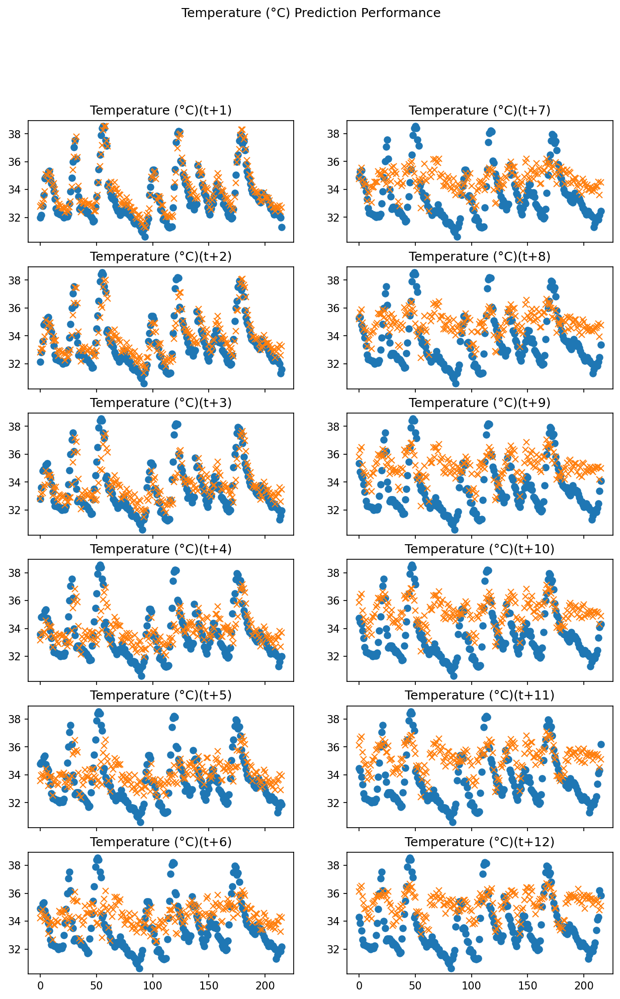

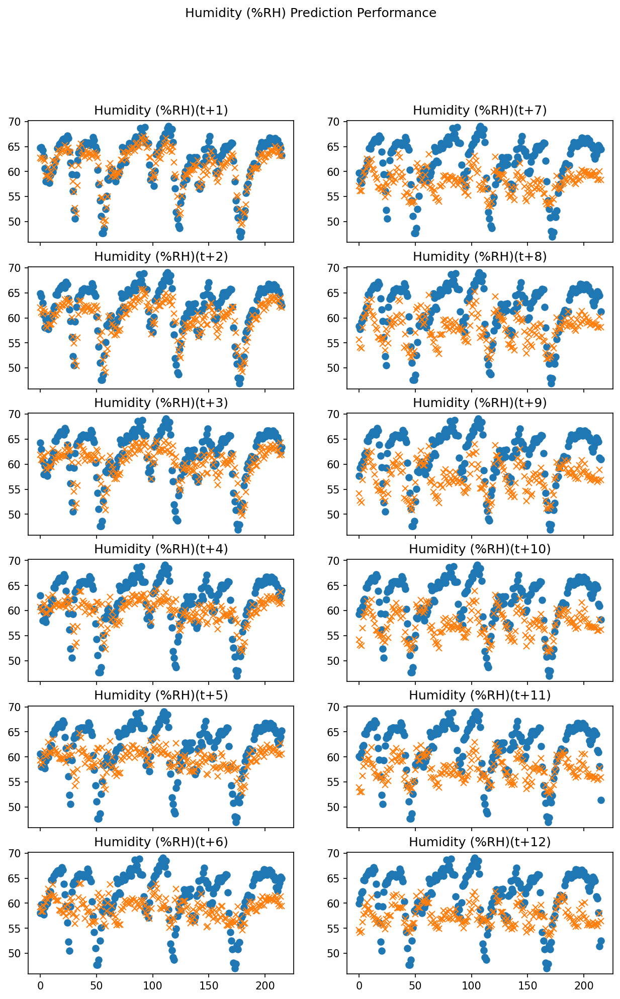

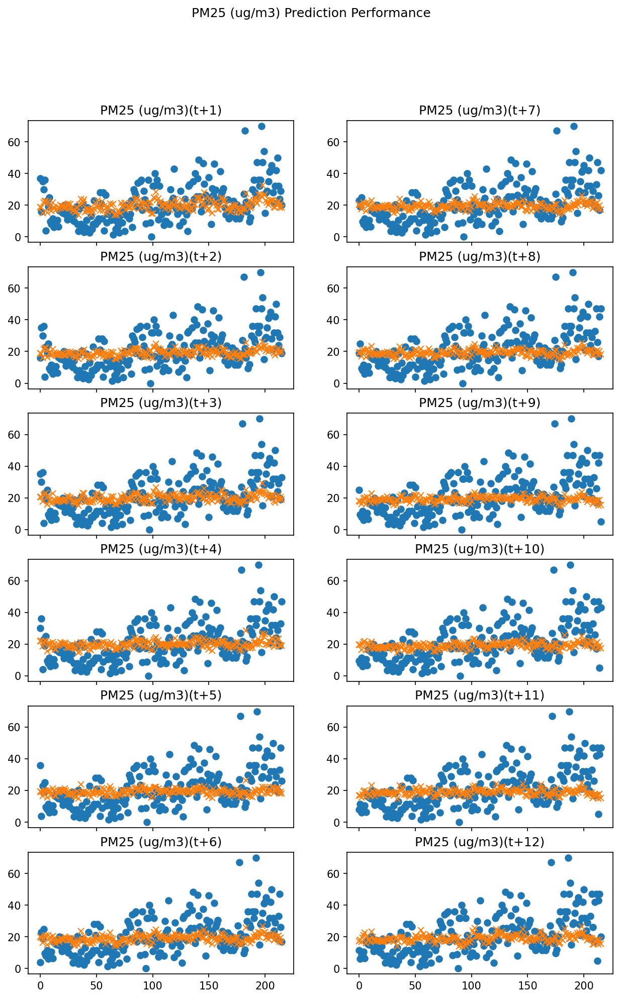

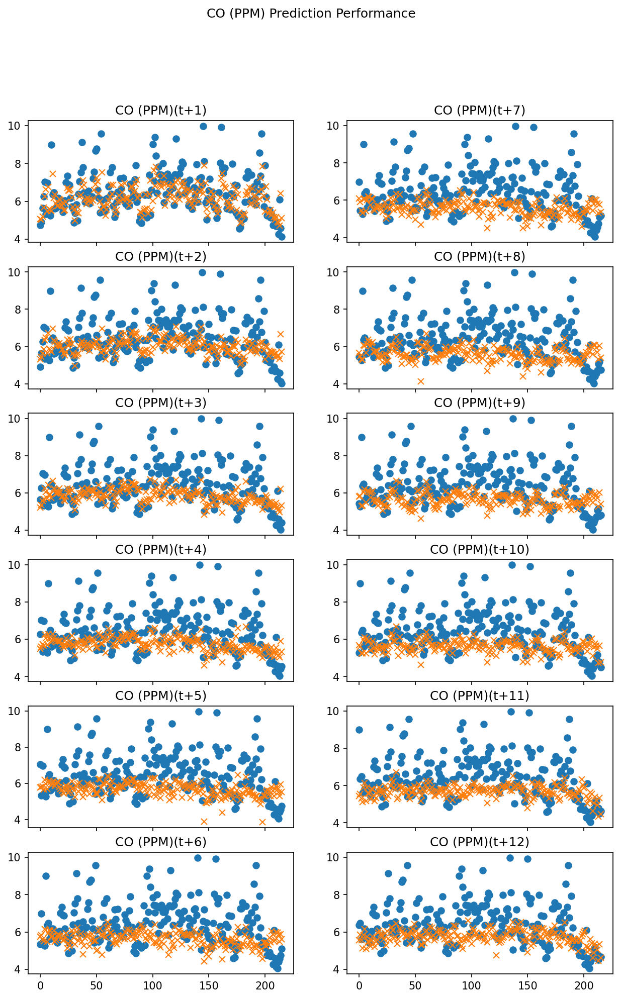

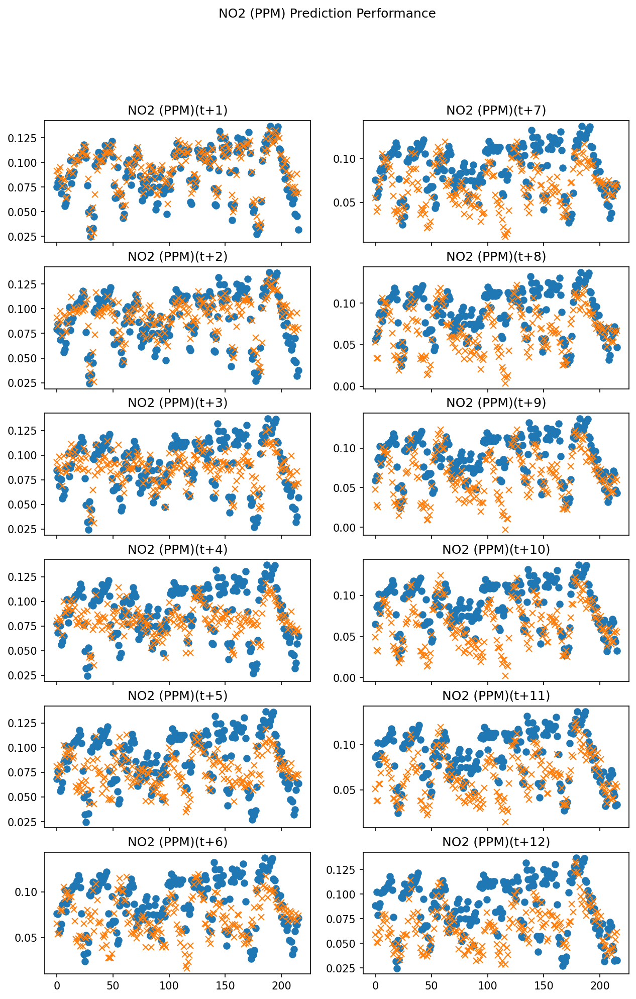

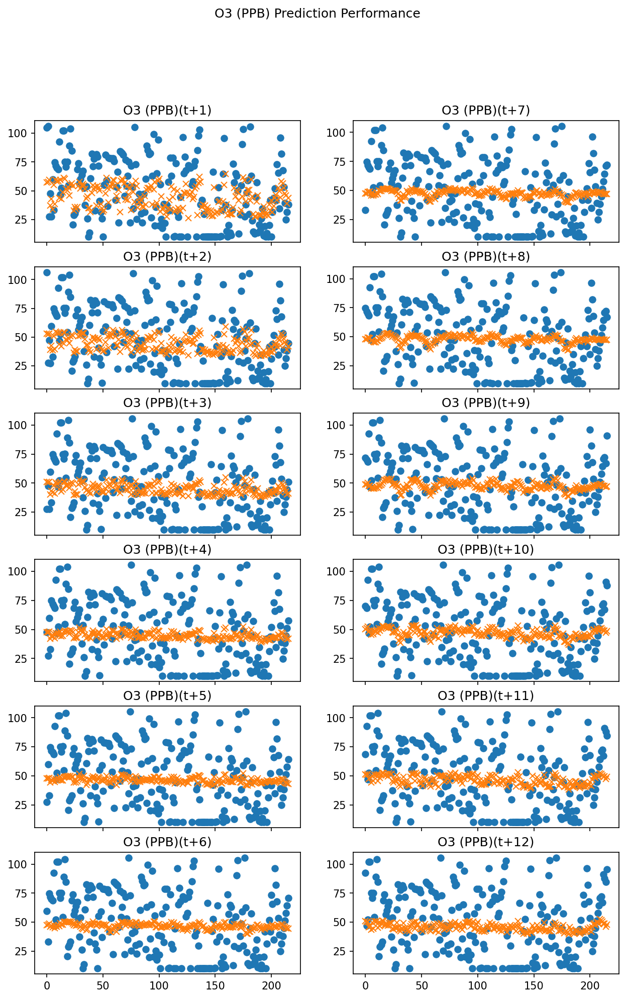

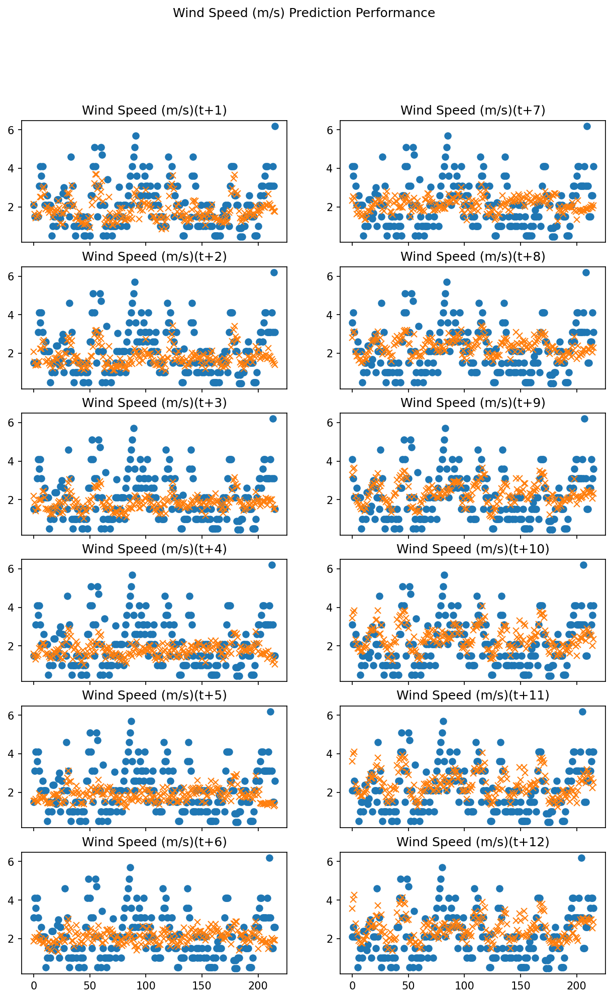

In [127]:
t = np.arange(0, len(y_test))

for label_name in svr_models:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = svr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [55]:
import os

In [56]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}

In [185]:
# save the model to disk
root_folder = 'ml_models'
base_name = 'direct_svr'

# try to create directory if not created yet
directory = os.path.join(root_folder, base_name)
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in svr_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

Dumped model into file (temp_model.sav)
Dumped model into file (hum_model.sav)
Dumped model into file (pm25_model.sav)
Dumped model into file (co_model.sav)
Dumped model into file (no2_model.sav)
Dumped model into file (o3_model.sav)
Dumped model into file (wind_speed_model.sav)
Dumped model into file (wind_dir_model.sav)
Dumped model into file (weather_model.sav)


### try to load model

In [58]:
svr_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        svr_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


## Random Forest
Advantage of RF is that it supports multi-output regression without any configs required

In [186]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

In [187]:
# Parameters for model tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [188]:
rf_models = {}
for label_name in y_train_dict:
    y_train = y_train_multi_dict[label_name]
    rf_estimator = RandomForestRegressor()
    # determine best parameters using RandomizedSearchCV
    rf_random = RandomizedSearchCV(estimator = rf_estimator,
                                   param_distributions = random_grid, 
                                   n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
   # Fit the random search model
    rf_random.fit(x_train, y_train)
    rf_models[label_name] = rf_random
    print(rf_random.best_params_)
    print('done fitting model for {}'.format(label_name))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.5min finished


{'n_estimators': 1600, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': True}
done fitting model for Temperature (°C)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.4min finished


{'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 110, 'bootstrap': True}
done fitting model for Humidity (%RH)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  5.0min finished


{'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
done fitting model for PM25 (ug/m3)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.6min finished


{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'auto', 'max_depth': 80, 'bootstrap': True}
done fitting model for CO (PPM)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.4min finished


{'n_estimators': 1600, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': True}
done fitting model for NO2 (PPM)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.5min finished


{'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 100, 'bootstrap': True}
done fitting model for O3 (PPB)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.5min finished


{'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}
done fitting model for Wind Speed (m/s)
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.7min finished


{'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
done fitting model for api_weather Code
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.5min finished


{'n_estimators': 1000, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
done fitting model for Wind Direction Code


### RMSE

In [ ]:
for label_name in rf_models:
    print('RMSE for {}'.format(label_name))
    preds = rf_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

### PLCC

In [ ]:
for label_name in rf_models:
    print('PLCC for {}'.format(label_name))
    preds = rf_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

### Plot the performance of the model

In [ ]:
t = np.arange(0, len(y_test))

for label_name in rf_models:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = rf_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [189]:
import os

In [60]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}
root_folder = 'ml_models'
base_name = 'random_forest'
directory = os.path.join(root_folder, base_name)

In [191]:
# save the model to disk

# try to create directory if not created yet
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in rf_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

Dumped model into file (temp_model.sav)
Dumped model into file (hum_model.sav)
Dumped model into file (pm25_model.sav)
Dumped model into file (co_model.sav)
Dumped model into file (no2_model.sav)
Dumped model into file (o3_model.sav)
Dumped model into file (wind_speed_model.sav)
Dumped model into file (wind_dir_model.sav)
Dumped model into file (weather_model.sav)


### try to load model

In [61]:
rf_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        rf_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


## Stochastic Gradient Boosting (SGD Trees)

In [192]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain

In [197]:
# Parameters for model tuning

# loss function to use
loss = [ 'ls' ]
# learning rate shrinks the contribution of each tree
learning_rate = [ 0.1 ]
# the number of boosting stages to perform.
n_estimators = [ int(x) for x in np.linspace(start = 100, stop = 2000, num = 5) ]
# The fraction of samples to be used for fitting the individual base learners
subsample = [ 0.8 ]
# The minimum number of samples required to split an internal node
min_samples_split = [ 2, 4 ]
# The minimum number of samples required to be at a leaf node
min_samples_leaf = [ 1, 2 ]
# maximum depth of the individual regression estimators.
max_depth = [ 4, 8 ]
# The number of features to consider when looking for the best split:
max_features = [ 'sqrt', 'log2' ]

# Create the random grid
estimator_name = 'base_estimator'
random_grid = {'{}__loss'.format(estimator_name): loss,
              '{}__learning_rate'.format(estimator_name): learning_rate,
               '{}__n_estimators'.format(estimator_name): n_estimators,
               '{}__subsample'.format(estimator_name): subsample,
               '{}__min_samples_split'.format(estimator_name): min_samples_split,
               '{}__min_samples_leaf'.format(estimator_name): min_samples_leaf,
               '{}__max_depth'.format(estimator_name): max_depth,
               '{}__max_features'.format(estimator_name): max_features
              }

In [198]:
sgd_models = {}
for label_name in y_train_dict:
    y_train = y_train_multi_dict[label_name]
    sgd_model = RegressorChain(base_estimator = GradientBoostingRegressor())
    # determine best parameters using GridSearchCV
    cv_sgd = GridSearchCV(
            estimator = sgd_model,
            param_grid = random_grid,
            cv = 3, scoring = 'neg_mean_squared_error', verbose = 2, n_jobs = -1)
    cv_sgd.fit(x_train, y_train)
    sgd_models[label_name] = cv_sgd
    print(cv_sgd.best_params_)
    print('done fitting model for {}'.format(label_name))

Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.8min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'sqrt', 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for Temperature (°C)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.9min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'sqrt', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for Humidity (%RH)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.5min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'log2', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for PM25 (ug/m3)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.8min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'sqrt', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 4, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for CO (PPM)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.8min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'log2', 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 4, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for NO2 (PPM)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.9min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'log2', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 4, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for O3 (PPB)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.2min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'sqrt', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 4, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for Wind Speed (m/s)
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  4.9min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 4, 'base_estimator__max_features': 'sqrt', 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for api_weather Code
Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.0min finished


{'base_estimator__learning_rate': 0.1, 'base_estimator__loss': 'ls', 'base_estimator__max_depth': 8, 'base_estimator__max_features': 'log2', 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__n_estimators': 100, 'base_estimator__subsample': 0.8}
done fitting model for Wind Direction Code


### RMSE

In [214]:
for label_name in sgd_models:
    print('RMSE for {}'.format(label_name))
    preds = sgd_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

RMSE for Temperature (°C)
Model(t+1): 0.8238607301299468
Model(t+2): 1.493525207988191
Model(t+3): 1.974859170985671
Model(t+4): 2.350953800471356
Model(t+5): 2.567975604657189
Model(t+6): 2.627189520712307
Model(t+7): 2.7573397986982386
Model(t+8): 2.7778632642877885
Model(t+9): 2.637434910434931
Model(t+10): 2.6316350986818926
Model(t+11): 2.6459050502953865
Model(t+12): 2.684447581649915
RMSE for Humidity (%RH)
Model(t+1): 2.2117442888231884
Model(t+2): 3.6106827947592355
Model(t+3): 4.789861610916416
Model(t+4): 5.525659777606093
Model(t+5): 5.740608740237247
Model(t+6): 5.965220691907124
Model(t+7): 6.0206347188040965
Model(t+8): 6.165383375646735
Model(t+9): 6.220184115509141
Model(t+10): 6.5231283285645505
Model(t+11): 6.948236605026778
Model(t+12): 7.27196883021859
RMSE for PM25 (ug/m3)
Model(t+1): 14.771080407294717
Model(t+2): 15.053609023052402
Model(t+3): 17.438861712797628
Model(t+4): 19.282976559604162
Model(t+5): 18.113932443316152
Model(t+6): 14.773055334544312
Model(t+

### PLCC

In [112]:
for label_name in sgd_models:
    print('PLCC for {}'.format(label_name))
    preds = sgd_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for PM25 (ug/m3)
Model(t+1): (0.20828960488910273, 0.0020889971594523307)
Model(t+2): (0.12869694120236053, 0.058980842940212025)
Model(t+3): (-0.04469369491738946, 0.5135141384415768)
Model(t+4): (0.07448061349549273, 0.2758013572994025)
Model(t+5): (0.09848928712888366, 0.14913273840314464)
Model(t+6): (-0.0006723009904631889, 0.9921621596693944)
Model(t+7): (0.09951765253440674, 0.14491244374333606)
Model(t+8): (-0.0391291634099861, 0.5673483176947979)
Model(t+9): (-0.013854573930788818, 0.8395664813322915)
Model(t+10): (-0.014117858293257162, 0.8365600008943328)
Model(t+11): (0.027955549360995913, 0.6828649145844229)
Model(t+12): (-0.07003126866694223, 0.30558430109474244)


### Plot the performance of the model

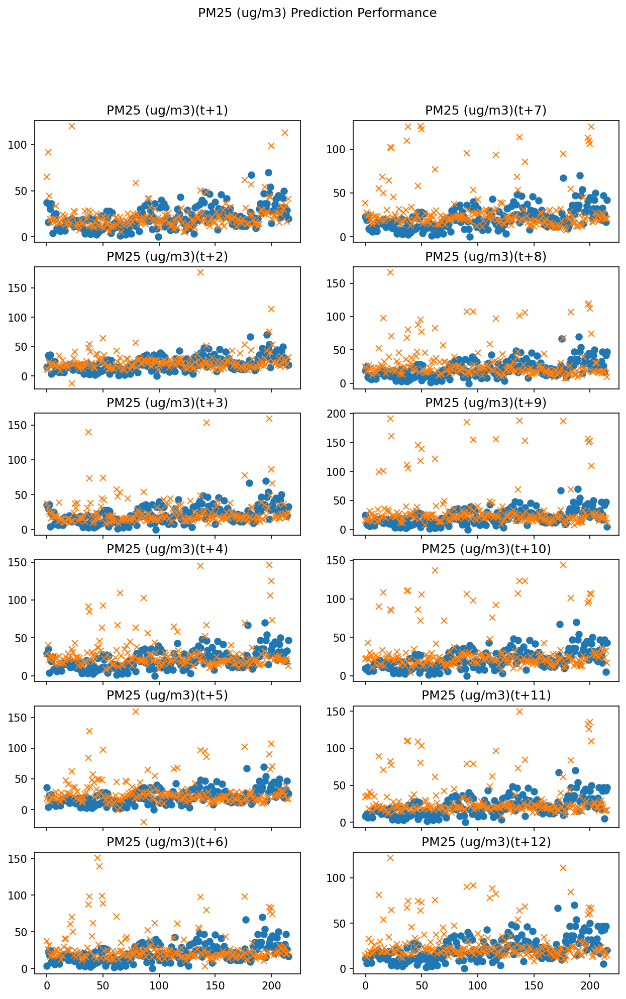

In [113]:
t = np.arange(0, len(y_test))

for label_name in sgd_models:
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    row, col = 0, 0
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = sgd_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [62]:
import os

In [64]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}
root_folder = 'ml_models'
base_name = 'sgd'
directory = os.path.join(root_folder, base_name)

In [201]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in sgd_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

Successfully created the directory ml_models\sgd
Dumped model into file (temp_model.sav)
Dumped model into file (hum_model.sav)
Dumped model into file (pm25_model.sav)
Dumped model into file (co_model.sav)
Dumped model into file (no2_model.sav)
Dumped model into file (o3_model.sav)
Dumped model into file (wind_speed_model.sav)
Dumped model into file (wind_dir_model.sav)
Dumped model into file (weather_model.sav)


### try to load model

In [65]:
sgd_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        sgd_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


## Nearest Neighbors Regression

In [202]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

In [203]:
# tuning grid for hyperparameters

n_neighbors = [ int(x) for x in np.linspace( 2, 16, 9) ]
weights = [ 'uniform', 'distance' ]
algorithm = [ 'auto', 'ball_tree', 'kd_tree', 'brute' ]

hype_params_grid = {
    'nb__n_neighbors': n_neighbors,
    'nb__weights': weights,
    'nb__algorithm': algorithm
}

In [204]:
nb_models = {}
for label_name in y_train_dict:
    y_train = y_train_multi_dict[label_name]
    nb_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('nb', KNeighborsRegressor())
    ])
    # determine best parameters using GridSearchCV
    nb_cv = GridSearchCV(
                estimator=nb_pipe,
                param_grid=hype_params_grid,
                cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
   # Fit the random search model
    nb_cv.fit(x_train, y_train)
    nb_models[label_name] = nb_cv
    print(nb_cv.best_params_)
    print('done fitting model for {}'.format(label_name))

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for Temperature (°C)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for Humidity (%RH)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for PM25 (ug/m3)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'brute', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for CO (PPM)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for NO2 (PPM)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'distance'}
done fitting model for O3 (PPB)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'uniform'}
done fitting model for Wind Speed (m/s)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s


{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'uniform'}
done fitting model for api_weather Code
Fitting 3 folds for each of 72 candidates, totalling 216 fits
{'nb__algorithm': 'auto', 'nb__n_neighbors': 16, 'nb__weights': 'uniform'}
done fitting model for Wind Direction Code


[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:    0.6s finished


### RMSE

In [ ]:
for label_name in nb_models:
    print('RMSE for {}'.format(label_name))
    preds = nb_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

### PLCC

In [ ]:
for label_name in nb_models:
    print('PLCC for {}'.format(label_name))
    preds = nb_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

### Plot the performance of the model

In [ ]:
t = np.arange(0, len(y_test))

for label_name in nb_models:
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    row, col = 0, 0
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = nb_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [205]:
import os

In [66]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}
root_folder = 'ml_models'
base_name = 'nbr'
directory = os.path.join(root_folder, base_name)

In [207]:
# save the model to disk

# try to create directory if not created yet
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in nb_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

Successfully created the directory ml_models\nbr
Dumped model into file (temp_model.sav)
Dumped model into file (hum_model.sav)
Dumped model into file (pm25_model.sav)
Dumped model into file (co_model.sav)
Dumped model into file (no2_model.sav)
Dumped model into file (o3_model.sav)
Dumped model into file (wind_speed_model.sav)
Dumped model into file (wind_dir_model.sav)
Dumped model into file (weather_model.sav)


### try to load model

In [68]:
nb_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        nb_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


## Recurrent Support Vector Regression (R-SVR)

In [97]:
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain

In [209]:
# hyper parameters tuning
params = {
    'rgrchain__base_estimator__C': [0.1, 1, 100, 1000],
    'rgrchain__base_estimator__epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10],
    'rgrchain__base_estimator__gamma': [0.0001, 0.001, 0.005, 0.1, 1, 3, 5]}

In [210]:
rsvr_models = {}
for label_name in y_train_dict:
    y_train = y_train_multi_dict[label_name]
    rsvr_pipe = Pipeline([
                ('scaler', StandardScaler()),
                ('rgrchain', RegressorChain(base_estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_svr = GridSearchCV(
        estimator=rsvr_pipe,
        param_grid=params,
        cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    cv_svr.fit(x_train, y_train)
    rsvr_models[label_name] = cv_svr
    print(cv_svr.best_params_)
    print('done fitting model for {}'.format(label_name))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 1262 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  3.0min remaining:    2.6s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  3.0min finished


{'rgrchain__base_estimator__C': 1, 'rgrchain__base_estimator__epsilon': 0.5, 'rgrchain__base_estimator__gamma': 0.005}
done fitting model for Temperature (°C)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1013 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 1458 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.6min finished


{'rgrchain__base_estimator__C': 100, 'rgrchain__base_estimator__epsilon': 1, 'rgrchain__base_estimator__gamma': 0.001}
done fitting model for Humidity (%RH)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.1min finished


{'rgrchain__base_estimator__C': 1000, 'rgrchain__base_estimator__epsilon': 0.5, 'rgrchain__base_estimator__gamma': 0.0001}
done fitting model for PM25 (ug/m3)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 1307 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.6min finished


{'rgrchain__base_estimator__C': 100, 'rgrchain__base_estimator__epsilon': 0.1, 'rgrchain__base_estimator__gamma': 0.001}
done fitting model for CO (PPM)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 549 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 1236 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  6.0min remaining:    5.3s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  7.8min finished


{'rgrchain__base_estimator__C': 1, 'rgrchain__base_estimator__epsilon': 0.01, 'rgrchain__base_estimator__gamma': 0.005}
done fitting model for NO2 (PPM)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   59.2s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.0min finished


{'rgrchain__base_estimator__C': 100, 'rgrchain__base_estimator__epsilon': 10, 'rgrchain__base_estimator__gamma': 0.0001}
done fitting model for O3 (PPB)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   23.1s
[Parallel(n_jobs=-1)]: Done 1262 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.4min finished


{'rgrchain__base_estimator__C': 100, 'rgrchain__base_estimator__epsilon': 1, 'rgrchain__base_estimator__gamma': 0.001}
done fitting model for Wind Speed (m/s)
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   24.3s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 1517 out of 1540 | elapsed:  5.9min remaining:    5.3s
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  6.1min finished


{'rgrchain__base_estimator__C': 1, 'rgrchain__base_estimator__epsilon': 0.1, 'rgrchain__base_estimator__gamma': 3}
done fitting model for api_weather Code
Fitting 5 folds for each of 308 candidates, totalling 1540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 1249 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1540 out of 1540 | elapsed:  2.2min finished


{'rgrchain__base_estimator__C': 1, 'rgrchain__base_estimator__epsilon': 1, 'rgrchain__base_estimator__gamma': 0.001}
done fitting model for Wind Direction Code


### RMSE

In [98]:
for label_name in rsvr_models:
    print('RMSE for {}'.format(label_name))
    preds = rsvr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

RMSE for Temperature (°C)
Model(t+1): 0.7293421932271199
Model(t+2): 1.160044437350627
Model(t+3): 1.5497492577350074
Model(t+4): 1.8390848242334754
Model(t+5): 2.050263726108516
Model(t+6): 2.1357223657463913
Model(t+7): 2.1733874164895206
Model(t+8): 2.173355016740465
Model(t+9): 2.185155035030439
Model(t+10): 2.2500769461216596
Model(t+11): 2.3010491444569503
Model(t+12): 2.3714485160695453
RMSE for Humidity (%RH)
Model(t+1): 1.861554517526107
Model(t+2): 3.0152623646980374
Model(t+3): 3.9173654349985485
Model(t+4): 4.535659324793711
Model(t+5): 4.832965395524347
Model(t+6): 4.937089540037861
Model(t+7): 5.05486721820122
Model(t+8): 5.1423854440087196
Model(t+9): 5.353702995633017
Model(t+10): 5.855457505198514
Model(t+11): 6.487168976505266
Model(t+12): 6.921705809494174
RMSE for PM25 (ug/m3)
Model(t+1): 12.362229133916092
Model(t+2): 12.295504475612997
Model(t+3): 12.621917957145563
Model(t+4): 12.475332873807055
Model(t+5): 12.778288018441796
Model(t+6): 12.369766567203879
Model(

### PLCC

In [224]:
for label_name in rsvr_models:
    print('PLCC for {}'.format(label_name))
    preds = rsvr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for Temperature (°C)
Model(t+1): (0.9326882347414703, 9.800245083567844e-97)
Model(t+2): (0.8083129890091224, 3.9199336183106564e-51)
Model(t+3): (0.6203966541545638, 2.2813737836974243e-24)
Model(t+4): (0.4299093061849063, 3.966443724202659e-11)
Model(t+5): (0.2762065072028954, 3.851787794766757e-05)
Model(t+6): (0.2791168645458767, 3.163516689191652e-05)
Model(t+7): (0.3479200549224476, 1.532680700572008e-07)
Model(t+8): (0.4364914717448057, 1.8444525714012002e-11)
Model(t+9): (0.5204128612717072, 2.1743614834418862e-16)
Model(t+10): (0.549088332861887, 2.0796113061486043e-18)
Model(t+11): (0.5392457788084737, 1.078538541632876e-17)
Model(t+12): (0.4840574533547214, 4.350690220803793e-14)
PLCC for Humidity (%RH)
Model(t+1): (0.9269290845825721, 4.678971506075388e-93)
Model(t+2): (0.7923022673570828, 8.248075667416984e-48)
Model(t+3): (0.616789333295183, 4.972937426628576e-24)
Model(t+4): (0.4380080080915325, 1.5425235723034787e-11)
Model(t+5): (0.32784035189840405, 8.34404341998

### Plot the performance of the model

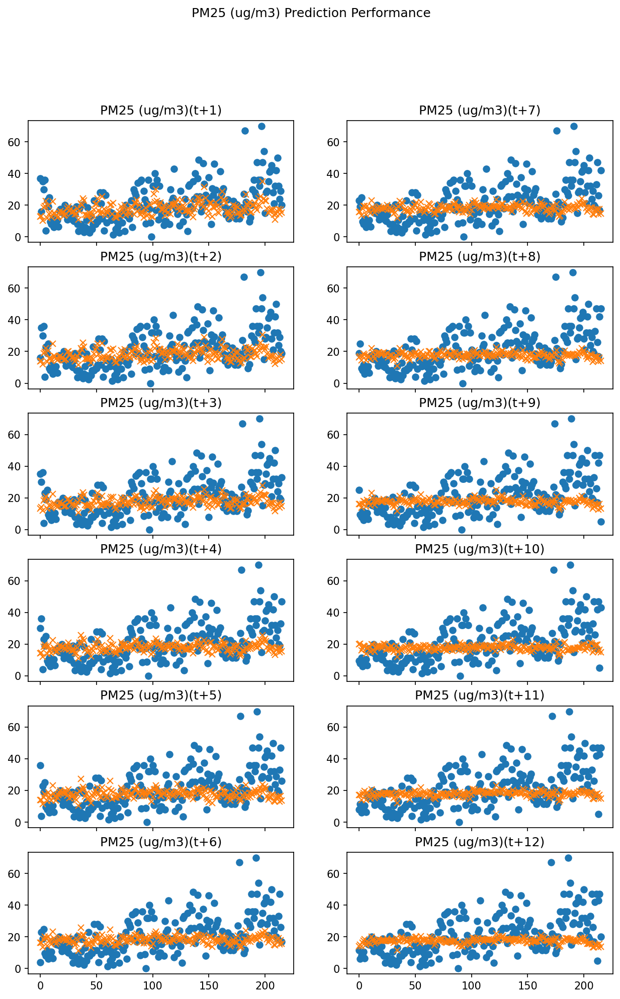

In [82]:
t = np.arange(0, len(y_test))

for label_name in rsvr_models:
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    row, col = 0, 0
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = rsvr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [211]:
import os

In [69]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}
root_folder = 'ml_models'
base_name = 'rsvr'
directory = os.path.join(root_folder, base_name)

In [213]:
# save the model to disk


# try to create directory if not created yet
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in rsvr_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

Successfully created the directory ml_models\rsvr
Dumped model into file (temp_model.sav)
Dumped model into file (hum_model.sav)
Dumped model into file (pm25_model.sav)
Dumped model into file (co_model.sav)
Dumped model into file (no2_model.sav)
Dumped model into file (o3_model.sav)
Dumped model into file (wind_speed_model.sav)
Dumped model into file (wind_dir_model.sav)
Dumped model into file (weather_model.sav)


### try to load model

In [70]:
rsvr_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        rsvr_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


## Ensemble (5 Regressors)
Consists of 5 regressors:
- SVR
- R-SVR
- Random Forest
- SGD
- Nearest Neighbors

We take the mean of the predicted values of each regressor to get the final model's predicted value.

In [47]:
# learner models
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
# final meta estimator
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
# others
from sklearn.ensemble import StackingRegressor
from sklearn.multioutput import RegressorChain
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

### Hyperparameter tuning grid

In [53]:
svr_grid = {
    'C': [0.1, 1, 100, 1000],
    'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10],
    'gamma': [0.0001, 0.001, 0.005, 0.1, 1, 3, 5]}
# -------------------------------------------------------------------------------------------------
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num = 5)]
# Number of features to consider at every split
max_features = ['sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 100, num = 4)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2]
# Method of selecting samples for training each tree
bootstrap = [True]
# Create the random grid
rf_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
# -------------------------------------------------------------------------------------------------
# loss function to use
loss = [ 'ls' ]
# learning rate shrinks the contribution of each tree
learning_rate = [ 0.1 ]
# the number of boosting stages to perform.
n_estimators = [ int(x) for x in np.linspace(start = 100, stop = 2000, num = 5) ]
# The fraction of samples to be used for fitting the individual base learners
subsample = [ 0.8 ]
# The minimum number of samples required to split an internal node
min_samples_split = [ 2, 4 ]
# The minimum number of samples required to be at a leaf node
min_samples_leaf = [ 1, 2 ]
# maximum depth of the individual regression estimators.
max_depth = [ 4, 8 ]
# The number of features to consider when looking for the best split:
max_features = [ 'sqrt', 'log2' ]

# Create the random grid
sgboost_grid = {'loss': loss,
              'learning_rate': learning_rate,
               'n_estimators': n_estimators,
               'subsample': subsample,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_depth': max_depth,
               'max_features': max_features
              }
# -------------------------------------------------------------------------------------------------
n_neighbors = [ int(x) for x in np.linspace( start = 2, stop = 16, num = 9) ]
weights = [ 'uniform', 'distance' ]
algorithm = [ 'auto', 'ball_tree', 'kd_tree', 'brute' ]

nbr_grid = {
    'n_neighbors': n_neighbors,
    'weights': weights,
    'algorithm': algorithm
}

In [54]:
def get_optimizer_estimator(model_name):
    cv_model = None
    if model_name == 'svr':
        cv_model = GridSearchCV(
            estimator=SVR(kernel='rbf'),
            param_grid=svr_grid,
            cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    elif model_name == 'rf':
        cv_model = GridSearchCV(
            estimator=RandomForestRegressor(),
            param_grid=rf_grid,
            cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    elif model_name == 'sgd':
        cv_model = GridSearchCV(
            estimator=GradientBoostingRegressor(),
            param_grid=sgboost_grid,
            cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    elif model_name == 'nbr':
        cv_model = GridSearchCV(
            estimator=KNeighborsRegressor(),
            param_grid=nbr_grid,
            cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_model

In [55]:
# get a stacking ensemble of models
def get_stacking_ensemble(learner_names):
    # define the base models
    learner_list = list()
    for learner_name in learner_names:
        optimizer = get_optimizer_estimator(learner_name)
        learner_list.append((learner_name, optimizer))
    # define meta learner model
    meta_learner = SGDRegressor()
    # define the stacking ensemble
    model = StackingRegressor(estimators=learner_list, final_estimator=meta_learner, cv=3, n_jobs=-1)
    return model

In [ ]:
ensemble_models = {}
learning_model_names = ['svr', 'rf', 'sgd', 'nbr']
for label_name, y_train in y_train_multi_dict.items():
    stacker = get_stacking_ensemble(learning_model_names)
    stack_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('ensemble', stacker)
    ])
    rgr_chain = RegressorChain(base_estimator=stack_pipe)
    rgr_chain.get_params()
    rgr_chain.fit(x_train, y_train)
    ensemble_models[label_name] = rgr_chain
    print('done fitting model for {}'.format(label_name))
print('training done!')

done fitting model for Temperature (°C)


### RMSE

In [96]:
for label_name in ensemble_models:
    print('RMSE for {}'.format(label_name))
    preds = ensemble_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        print('Model(t+{}): {}'.format(idx + 1, rmse))

RMSE for Temperature (°C)
Model(t+1): 0.7737863714197095
Model(t+2): 1.433632346198612
Model(t+3): 1.9921861892655024
Model(t+4): 2.3447948616855125
Model(t+5): 2.6413652822239513
Model(t+6): 2.892298435332084
Model(t+7): 3.0746862257979735
Model(t+8): 3.230770609686744
Model(t+9): 3.3329756578662533
Model(t+10): 3.2644431162766248
Model(t+11): 3.2231755950912064
Model(t+12): 3.227628818013008
RMSE for Humidity (%RH)
Model(t+1): 2.0103717177229172
Model(t+2): 3.328011516015867
Model(t+3): 4.55485899734091
Model(t+4): 5.3500480858352235
Model(t+5): 5.7345029463697434
Model(t+6): 6.142161191533351
Model(t+7): 6.550977600438498
Model(t+8): 7.005656749918062
Model(t+9): 7.410736310519605
Model(t+10): 7.61176863199551
Model(t+11): 7.906278835588897
Model(t+12): 8.133074782055422
RMSE for PM25 (ug/m3)
Model(t+1): 11.277091617063723
Model(t+2): 11.53151668376416
Model(t+3): 11.344989548495576
Model(t+4): 11.349131600494104
Model(t+5): 11.543345294141417
Model(t+6): 11.51187510807923
Model(t+7

### PLCC

In [95]:
for label_name in ensemble_models:
    print('PLCC for {}'.format(label_name))
    preds = ensemble_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for Temperature (°C)
Model(t+1): (0.9120408394008729, 8.591671726714463e-85)
Model(t+2): (0.6853173354848145, 2.6633275015344302e-31)
Model(t+3): (0.38756549897529435, 3.746873215395093e-09)
Model(t+4): (0.19157317758546547, 0.0047218869277332685)
Model(t+5): (0.101786294382875, 0.1359241856405279)
Model(t+6): (0.13918311267370262, 0.0409877415934955)
Model(t+7): (0.1829530972449471, 0.007016885094885062)
Model(t+8): (0.22838601633825678, 0.0007198460916857236)
Model(t+9): (0.2695591988405775, 5.988914745500651e-05)
Model(t+10): (0.31377780441922987, 2.5491054440977676e-06)
Model(t+11): (0.23475689059381574, 0.0005034155557327835)
Model(t+12): (0.16343674032766514, 0.016204771735032535)
PLCC for Humidity (%RH)
Model(t+1): (0.9152965641796889, 1.8152671434571497e-86)
Model(t+2): (0.7538047632240674, 6.766554413713181e-41)
Model(t+3): (0.5039132174699787, 2.6040876976283466e-15)
Model(t+4): (0.2961032040816293, 9.589775855355447e-06)
Model(t+5): (0.2391441935825168, 0.00039129940459

### Plot the performance of the model

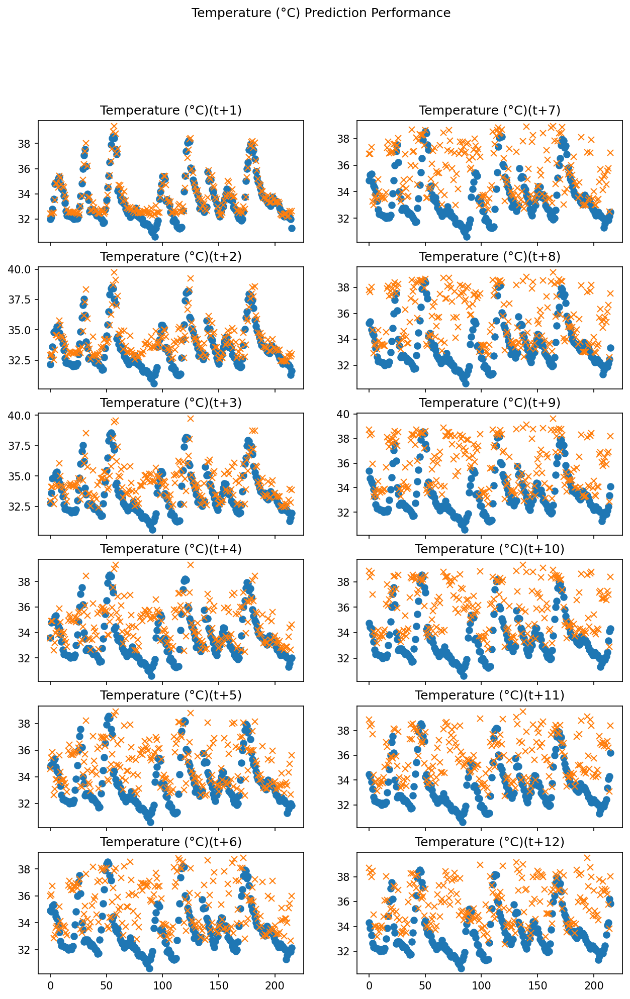

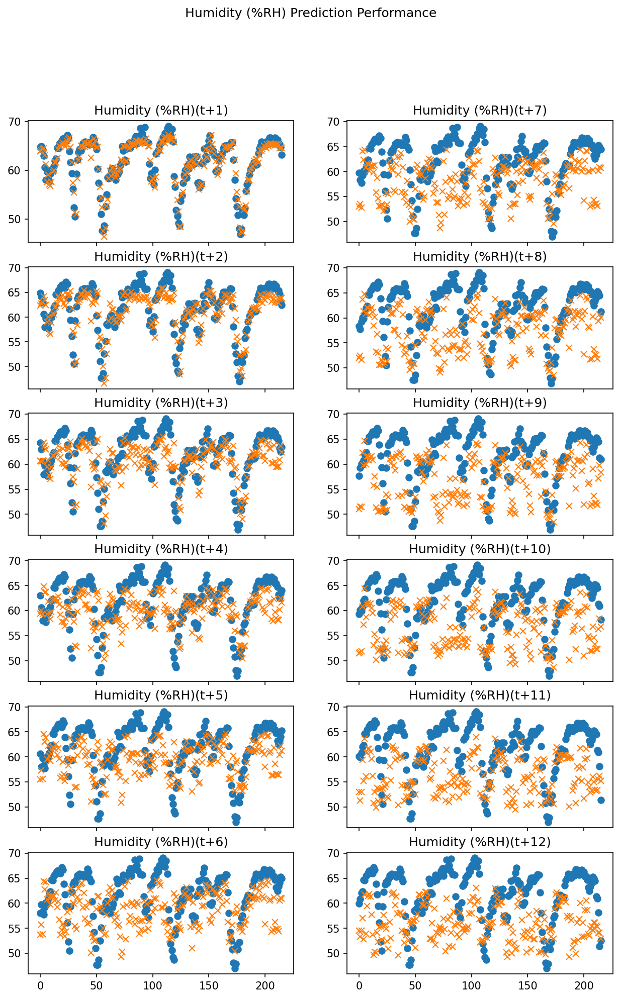

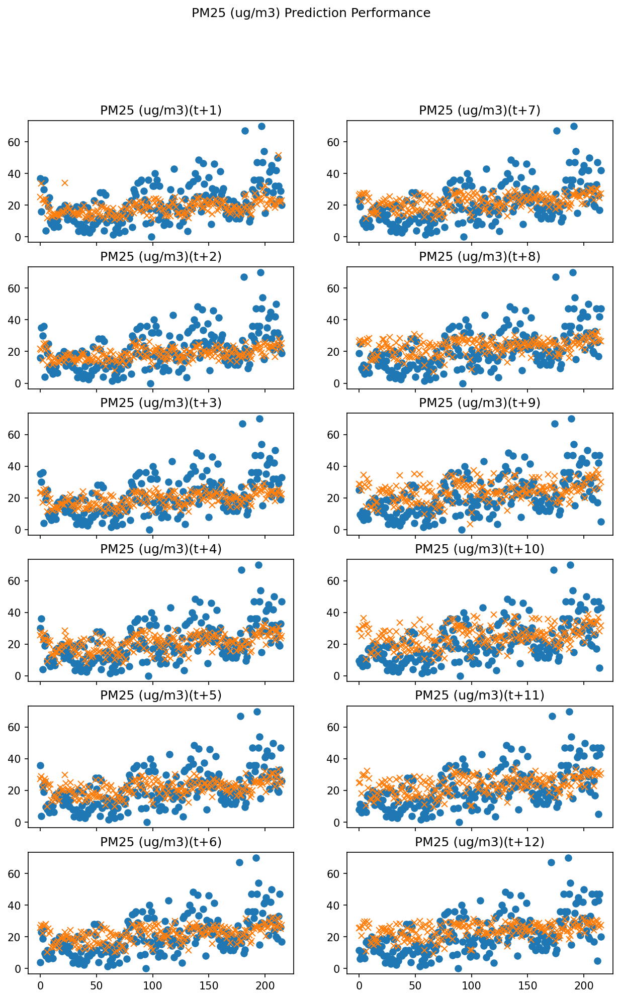

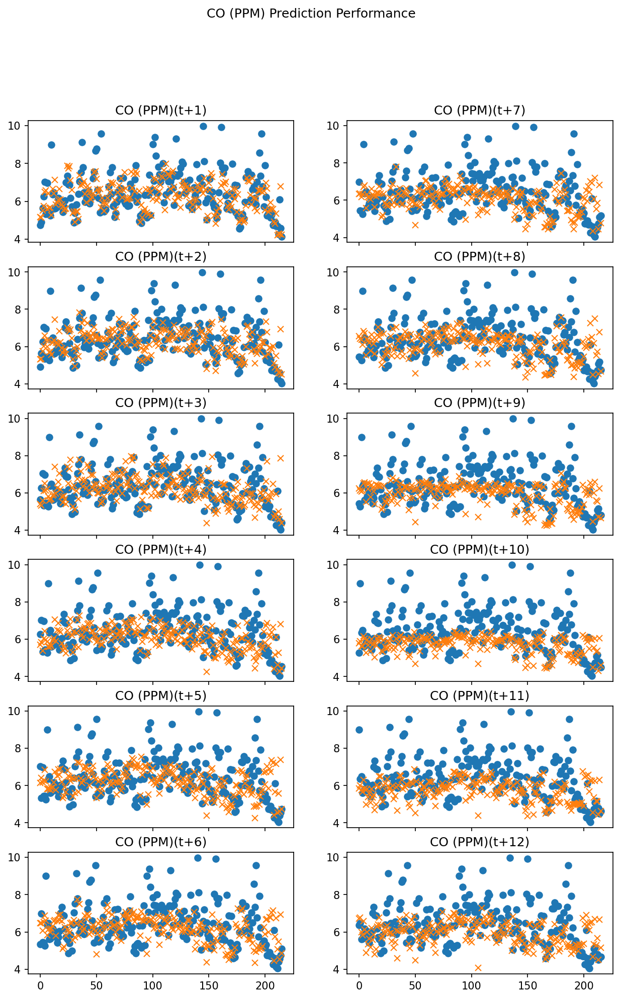

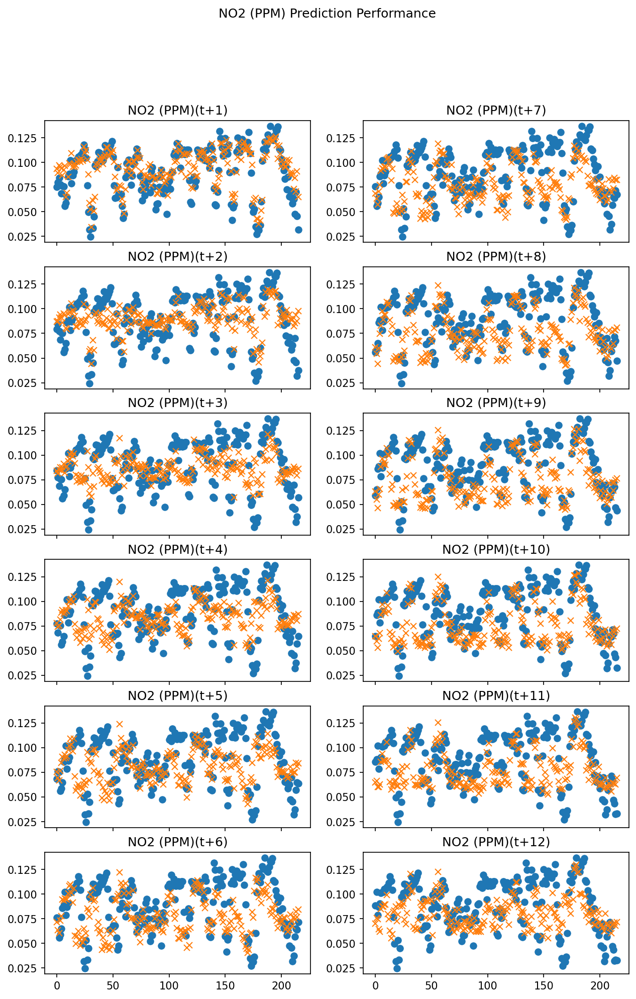

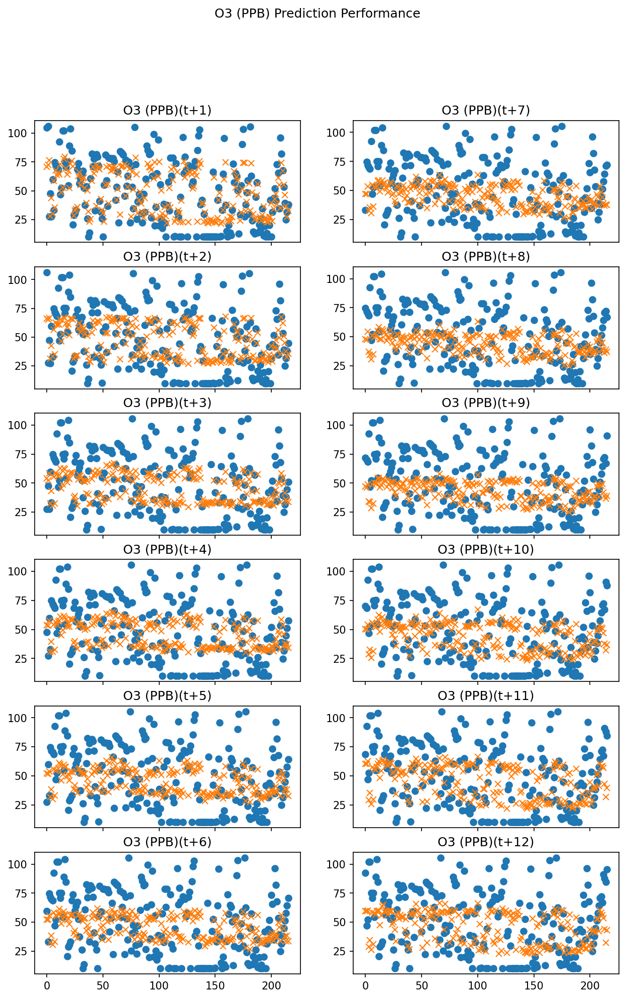

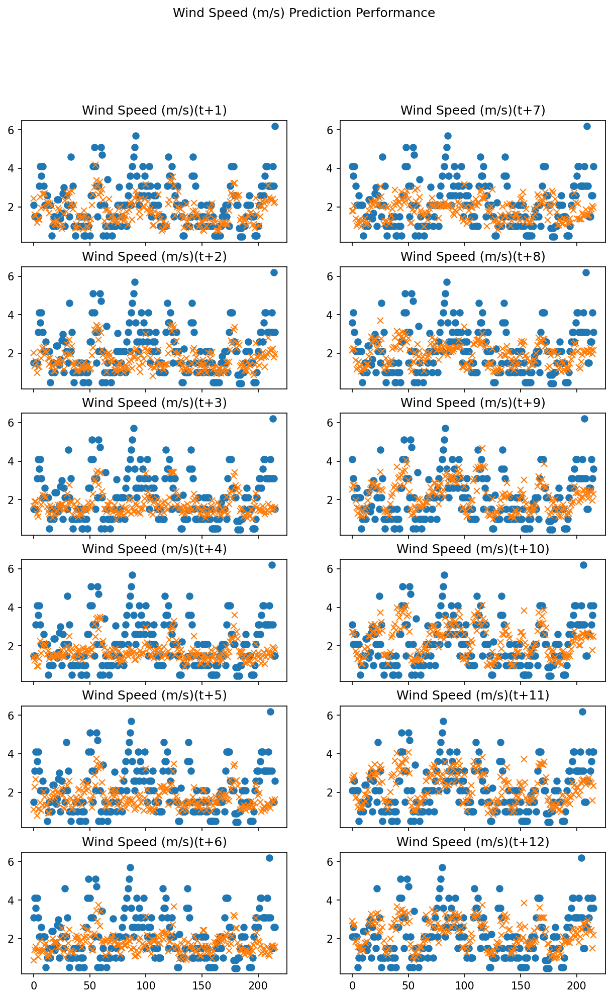

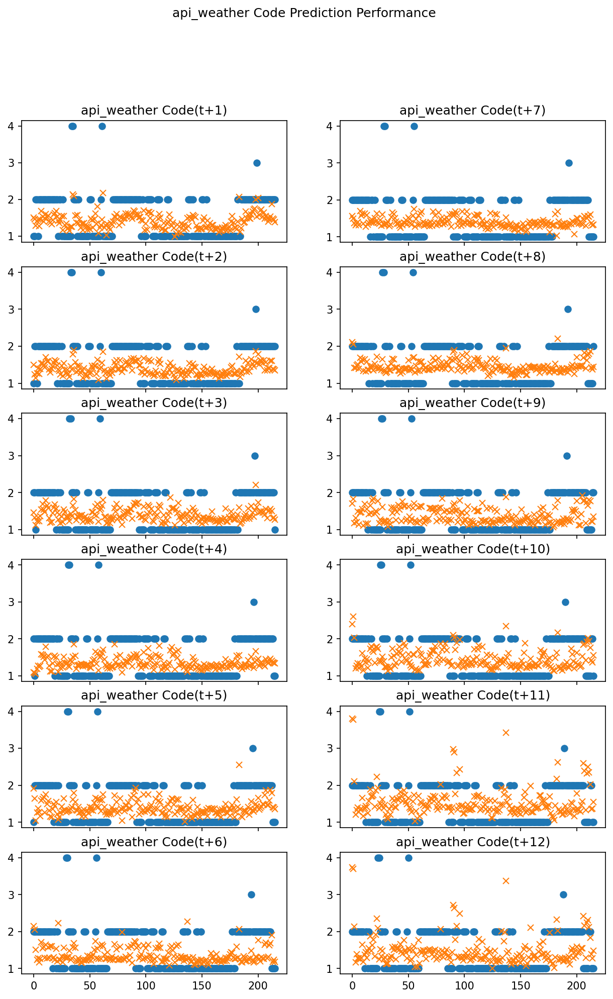

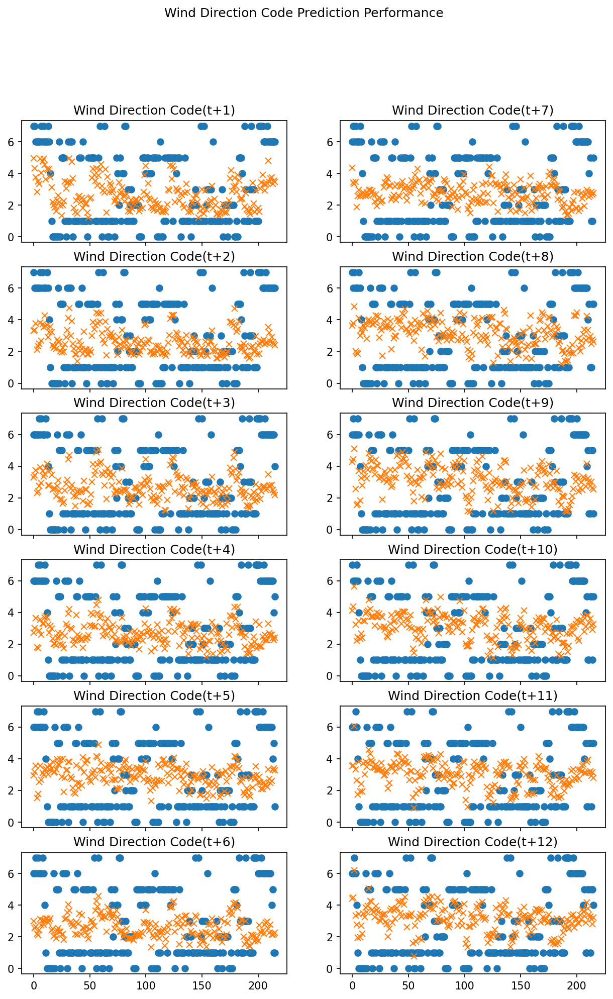

In [94]:
for label_name in ensemble_models:
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    row, col = 0, 0
    fig.suptitle('{} Prediction Performance'.format(label_name))
    preds = ensemble_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        t = np.arange(0, len(y_test))
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        ax[row][col].set_title(y_test_dict[label_name][idx].name)
        ax[row][col].plot(t, y_test, 'o')
        ax[row][col].plot(t, y_pred, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0

### Save the model for later use

In [1]:
import os

In [71]:
filename_dict = {
    'Temperature (°C)':'temp',
    'Humidity (%RH)':'hum',
    'PM25 (ug/m3)':'pm25',
    'CO (PPM)':'co',
    'NO2 (PPM)':'no2',
    'O3 (PPB)':'o3',
    'Wind Speed (m/s)':'wind_speed',
    'api_weather Code':'wind_dir',
    'Wind Direction Code':'weather'
}
root_folder = 'ml_models'
base_name = 'ensemble_stack'
directory = os.path.join(root_folder, base_name)

In [5]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(directory):
    try:
        os.makedirs(directory)
    except OSError:
        print ("Creation of the directory %s failed" % directory)
    else:
        print ("Successfully created the directory %s" % directory)

for label_name, model in ensemble_models.items():
    filename = '{}_model.sav'.format(filename_dict[label_name])
    joblib.dump(model, os.path.join(root_folder, base_name, filename))
    print('Dumped model into file ({})'.format(filename))
print('done!')

NameError: name 'directory' is not defined

### try to load model

In [72]:
ensemble_models = {}
for label_name, filename in filename_dict.items():
    complete_filename = '{}_model.sav'.format(filename)
    complete_path = os.path.join(directory, complete_filename)
    if os.path.exists(complete_path):
        loaded_model = joblib.load(complete_path)
        ensemble_models[label_name] = loaded_model
        print('Loaded model from file {}_model.sav'.format(filename))
    else:
        continue
print('done!')

Loaded model from file temp_model.sav
Loaded model from file hum_model.sav
Loaded model from file pm25_model.sav
Loaded model from file co_model.sav
Loaded model from file no2_model.sav
Loaded model from file o3_model.sav
Loaded model from file wind_speed_model.sav
Loaded model from file wind_dir_model.sav
Loaded model from file weather_model.sav
done!


# Do some statistical testing on the ensemble model vs the recurrent SVR

In [113]:
from scipy import stats

In [114]:
# gather plcc for recurrent svr
rsvr_plcc = {}
for label_name in rsvr_models:
    print('PLCC for {}'.format(label_name))
    rsvr_plcc[label_name] = list()
    preds = rsvr_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        rsvr_plcc[label_name].append(plcc[0])
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for Temperature (°C)
Model(t+1): (0.9326882347414703, 9.800245083567844e-97)
Model(t+2): (0.8083129890091224, 3.9199336183106564e-51)
Model(t+3): (0.6203966541545638, 2.2813737836974243e-24)
Model(t+4): (0.4299093061849063, 3.966443724202659e-11)
Model(t+5): (0.2762065072028954, 3.851787794766757e-05)
Model(t+6): (0.2791168645458767, 3.163516689191652e-05)
Model(t+7): (0.3479200549224476, 1.532680700572008e-07)
Model(t+8): (0.4364914717448057, 1.8444525714012002e-11)
Model(t+9): (0.5204128612717072, 2.1743614834418862e-16)
Model(t+10): (0.549088332861887, 2.0796113061486043e-18)
Model(t+11): (0.5392457788084737, 1.078538541632876e-17)
Model(t+12): (0.4840574533547214, 4.350690220803793e-14)
PLCC for Humidity (%RH)
Model(t+1): (0.9269290845825721, 4.678971506075388e-93)
Model(t+2): (0.7923022673570828, 8.248075667416984e-48)
Model(t+3): (0.616789333295183, 4.972937426628576e-24)
Model(t+4): (0.4380080080915325, 1.5425235723034787e-11)
Model(t+5): (0.32784035189840405, 8.34404341998

In [115]:
# gather plcc for ensemble
ensemble_plcc = {}
for label_name in ensemble_models:
    print('PLCC for {}'.format(label_name))
    ensemble_plcc[label_name] = list()
    preds = ensemble_models[label_name].predict(x_test)
    for idx, y_test in enumerate(y_test_dict[label_name]):
        y_pred = [ preds[forecast_idx][idx] for forecast_idx in range(len(preds)) ]
        y_test = y_test_dict[label_name][idx].values
        plcc = pearsonr(y_test, y_pred)
        ensemble_plcc[label_name].append(plcc[0])
        print('Model(t+{}): {}'.format(idx + 1, plcc))

PLCC for Temperature (°C)
Model(t+1): (0.9120408394008729, 8.591671726714463e-85)
Model(t+2): (0.6853173354848145, 2.6633275015344302e-31)
Model(t+3): (0.38756549897529435, 3.746873215395093e-09)
Model(t+4): (0.19157317758546547, 0.0047218869277332685)
Model(t+5): (0.101786294382875, 0.1359241856405279)
Model(t+6): (0.13918311267370262, 0.0409877415934955)
Model(t+7): (0.1829530972449471, 0.007016885094885062)
Model(t+8): (0.22838601633825678, 0.0007198460916857236)
Model(t+9): (0.2695591988405775, 5.988914745500651e-05)
Model(t+10): (0.31377780441922987, 2.5491054440977676e-06)
Model(t+11): (0.23475689059381574, 0.0005034155557327835)
Model(t+12): (0.16343674032766514, 0.016204771735032535)
PLCC for Humidity (%RH)
Model(t+1): (0.9152965641796889, 1.8152671434571497e-86)
Model(t+2): (0.7538047632240674, 6.766554413713181e-41)
Model(t+3): (0.5039132174699787, 2.6040876976283466e-15)
Model(t+4): (0.2961032040816293, 9.589775855355447e-06)
Model(t+5): (0.2391441935825168, 0.00039129940459

In [1]:
for label_name in rsvr_plcc:
    print('-- two-tailed t-test for {} --'.format(label_name))
    ttest, pval = stats.ttest_ind(ensemble_plcc[label_name], rsvr_plcc[label_name])
    print('p-val = {}, stats = {}'.format(pval, ttest))
    if abs(pval) > 0.05:
        print("==both are statistically insignificant")
    elif ttest < 0.0:
        print("==rsvr_plcc is superior")
    else:
        print("==(!!!) ensemble is superior") 

NameError: name 'rsvr_plcc' is not defined